Solution with pre-processing provided in template from Kaggle-team

In [ ]:
'''
1.  Google's colab version of Jupiter notebook with following advantages:
      - Runs in the cloud with nearly all-packages we need preinstalled for ML
      - Runtime allows us to use GPUs or TPUs
      - The ouput can be separate from the code - comes with IDE as Jupiter lab
      - Various features for code folding using GUI widgets and more
'''
IS_COLAB = "google.colab" in str(get_ipython())
print(IS_COLAB)

In [ ]:
''' 2. Standard Python libraries  '''

from __future__ import absolute_import, division, print_function, unicode_literals
import os, time, glob
from typing import Any, Callable, Dict, Iterator, Mapping, Optional, Sequence, Tuple
import numpy as np
import matplotlib.pyplot as plt

!pip list -v


In [ ]:
''' 3. JAX library

https://github.com/google/jax
'''

import jax
import jax.numpy as jnp
''' check if JAX is using GPU '''
print("jax backend {}".format(jax.lib.xla_bridge.get_backend().platform))


jax backend gpu


In [ ]:
''' 4. Tensorflow

Detect runtime accelerator
'''
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= '2.0'
print("tf version {}".format(tf.__version__))
print([d for d in tf.config.list_physical_devices()])

if not tf.config.list_physical_devices('GPU'):
  print('No GPU was detected')
  if IS_COLAB:
    print('Change Runtime settings')


tf version 2.12.0
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]
No GPU was detected
Change Runtime settings


In [ ]:
''' 5. PyTorch '''
import torch
import torchvision
print('torch version {}'.format(torch.__version__))
if torch.cuda.is_available():
  print(torch.cuda.get_device_name(0))
else:
  print('torch cannot find GPU')


torch version 2.0.1+cu118
torch cannot find GPU


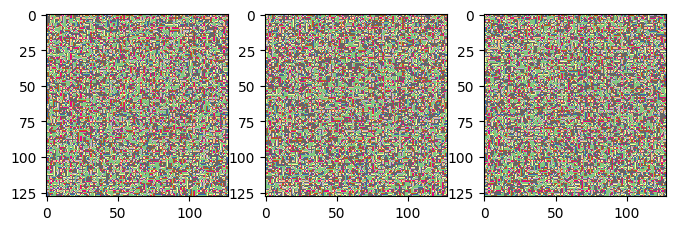

In [ ]:
''' Visualizing arrays

If we use imshow, we have to be careful of aliasing which can occur
for certain image sizes
'''
import numpy as np
np.random.seed(0)
fig, axs = plt.subplots(1, 3, figsize=(8, 8))
for t in range(3):
  X = np.random.binomial(1, 0.5, (128, 128))
  axs[t].imshow(X, cmap='Accent')


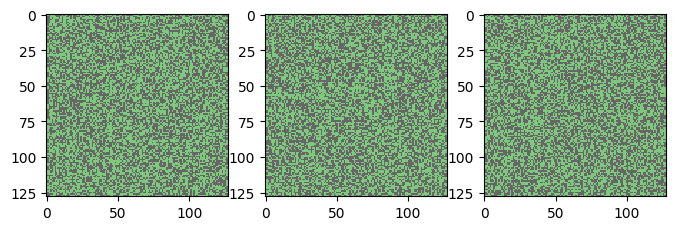

In [ ]:
''' we can solve this by specifying interpolation=nearest '''
np.random.seed(0)
fig, axs = plt.subplots(1, 3, figsize=(8, 8))
for t in range(3):
  X = np.random.binomial(1, 0.5, (128, 128))
  axs[t].imshow(X, cmap='Accent', interpolation='nearest')

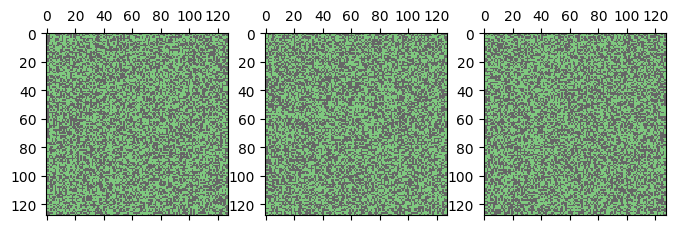

In [ ]:
''' using matshow which is an alias for imshow with interpolation=nearest '''
np.random.seed(0)
fig, axs = plt.subplots(1, 3, figsize=(8, 8))
for t in range(3):
    X = np.random.binomial(1, 0.5, (128, 128))
    axs[t].matshow(X, cmap="Accent")

In [ ]:
''' Working with GitHub '''

In [ ]:
''' Hardware Accelerators

By default colab runs on cpu, and we can change it to gpu or tpu
In order to get access we subscrive to colab pro
'''
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 14955937597668923015
 xla_global_id: -1,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 13806403584
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 17079914331815489329
 physical_device_desc: "device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5"
 xla_global_id: 416903419]

In [ ]:
!cat /proc/version

Linux version 5.15.107+ (builder@localhost) (Chromium OS 14.0_pre445002_p20220217-r3 clang version 14.0.0 (/var/tmp/portage/sys-devel/llvm-14.0_pre445002_p20220217-r3/work/llvm-14.0_pre445002_p20220217/clang 18308e171b5b1dd99627a4d88c7d6c5ff21b8c96), LLD 14.0.0) #1 SMP Sat Apr 29 09:15:28 UTC 2023


In [ ]:
from psutil import cpu_count
print('num cores', cpu_count())
!cat /proc/cpuinfo

num cores 8
processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 85
model name	: Intel(R) Xeon(R) CPU @ 2.00GHz
stepping	: 3
microcode	: 0xffffffff
cpu MHz		: 2000.210
cache size	: 39424 KB
physical id	: 0
siblings	: 8
core id		: 0
cpu cores	: 4
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm mpx avx512f avx512dq rdseed adx smap clflushopt clwb avx512cd avx512bw avx512vl xsaveopt xsavec xgetbv1 xsaves arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds sw

In [ ]:
''' memory '''
from psutil import virtual_memory

ram_gb = virtual_memory().total / 1e9
print('RAM (GB)', ram_gb)

RAM (GB) 54.757957632


In [ ]:
!cat /proc/meminfo

In [ ]:
''' gpus '''
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
print(gpu_info)
!grep Model: /proc/driver/nvidia/gpus/*/information | awk '{$1="";print$0}'

Wed Jun  7 01:58:25 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   57C    P0    28W /  70W |    885MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
''' installation of packages and imnports for the project '''
!pip install pytorch_lightning
!pip install monai

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 720.6/720.6 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 33.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 56.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 23.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.6/149.6 kB 14.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 15.8 MB/s eta 0:00:00


In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from IPython.display import HTML, display
from ipywidgets import interact, fixed
import seaborn as sns

from tqdm.notebook import tqdm
from tqdm import tqdm

import os, math, gc, glob
from collections import defaultdict
from io import StringIO
from pathlib import Path
from typing import Tuple, List
import pandas as pd
import PIL
import PIL.Image as Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [ ]:
import torch
import torch.utils.data as data
from torch.utils.data import ConcatDataset, DataLoader, Dataset
import pytorch_lightning as pl
import torchvision as torchvision
import torch.nn as nn
import torch.optim as optim

import monai
from monai.data import DataLoader, CSVDataset
from monai.inferers import sliding_window_inference
from torchmetrics import Dice
from torchmetrics import MetricCollection

In [ ]:
PREFIX = f'/content/drive/MyDrive/A_Vesuvius/'

In [ ]:
torch.cuda.is_available(),

(False,)

Process data with
  - 1) arrays and 2) tensors and input to the model

In [ ]:
''' check the files in the directory '''
!ls /content/drive/MyDrive/A_Vesuvius/train/1
!ls /content/drive/MyDrive/A_Vesuvius/train/1/surface_volume | wc
!ls /content/drive/MyDrive/A_Vesuvius/train/2/surface_volume | wc
!ls /content/drive/MyDrive/A_Vesuvius/train/3/surface_volume | wc

inklabels.png  inklabels_rle.csv  ir.png  mask.png  surface_volume
     66      66     459
     66      66     459
     66      66     459


In [ ]:
'''
Inklabels and Masks
- Train set has 'ir' files that include 'inklabels', which is very important
  for the problem we are trying to solve ~ the information to predict
- Test set doesn't have 'ir' files
- Masks are binary images that delimit the scroll from the background

Insights
- The Masks define the boundaries between the papyrus scroll and the background
- The Infrared files show the ink on the paper we use to create the label
- The label images are binary images where the pixels indicate the location
  of the ink

The aim here is the Segmentation identifying the location of the ink on the
paper, with each pixel having the value of 0 or 1.

Calculate the proportion of paper covered by ink for each papyrus using masks
and ink labels provided in the dataset.
'''

In [ ]:
''' utility function '''
def resize(image):
  width, height = image.size
  aspect_ratio = width/height
  shared_height = 8000
  new_width = int(shared_height * aspect_ratio)
  new_size = (new_width, shared_height)
  image = image.resize(new_size)
  return image

In [ ]:
z_slices, labels, masks = \
      [[] for _ in range(3)], [[] for _ in range(3)], [[] for _ in range(3)]

for i in [1, 2, 3]:
  z_slices[i-1] += sorted(glob.glob(
      f'{PREFIX}/train/{i}/surface_volume/*.tif'))[1:4]

  img_l = Image.open(f'{PREFIX}train/{i}/inklabels.png')
  img_l = resize(img_l)
  labels[i -1]= torch.from_numpy(np.array(img_l)).gt(0).float()
  img_m = Image.open(f'{PREFIX}train/{i}/mask.png').convert('1')
  img_m = resize(img_m)
  masks[i -1] = np.array(img_m)

z_slices, len(z_slices)

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:2918: DecompressionBombWarning: Image size (140973980 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


([['/content/drive/MyDrive/A_Vesuvius//train/1/surface_volume/01.tif',
   '/content/drive/MyDrive/A_Vesuvius//train/1/surface_volume/02.tif',
   '/content/drive/MyDrive/A_Vesuvius//train/1/surface_volume/03.tif'],
  ['/content/drive/MyDrive/A_Vesuvius//train/2/surface_volume/01.tif',
   '/content/drive/MyDrive/A_Vesuvius//train/2/surface_volume/02.tif',
   '/content/drive/MyDrive/A_Vesuvius//train/2/surface_volume/03.tif'],
  ['/content/drive/MyDrive/A_Vesuvius//train/3/surface_volume/01.tif',
   '/content/drive/MyDrive/A_Vesuvius//train/3/surface_volume/02.tif',
   '/content/drive/MyDrive/A_Vesuvius//train/3/surface_volume/03.tif']],
 3)

In [ ]:
labels,

([tensor([[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]),
  tensor([[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]),
  tensor([[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]])],)

In [ ]:
np.array(
    Image.open('/content/drive/MyDrive/A_Vesuvius/train/2/surface_volume/09.tif'),
    dtype=np.float32)/65536.0

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [ ]:
image_tensors__ = [ np.array(Image.open(img_name), dtype=np.float32)/65536.0
  for img_name in z_slices[0] ]
len(image_tensors__)

3

In [ ]:
image_stack = torch.stack([torch.from_numpy(image_tensor)
                           for image_tensor in image_tensors__])
z_dimension = image_stack.shape[0]
image_stack.shape

torch.Size([3, 8181, 6330])

In [ ]:
''' clear memory on the testing data '''
image_tensors__, image_stack = [], []

In [ ]:
''' operations with torch '''
arr_1 = torch.ones((10, 30, 50))
arr_2 = torch.zeros((10, 30, 50))
arr_ = torch.stack([arr_1, arr_1], dim=0)
arr__ = torch.stack([arr_2, arr_2], dim=0)
arr_stack = [arr_, arr__]
arr_volume = torch.cat([arr_stack[0], arr_stack[1]], axis=1)
arr_.shape, arr__.shape, arr_volume.shape

(torch.Size([2, 10, 30, 50]),
 torch.Size([2, 10, 30, 50]),
 torch.Size([2, 20, 30, 50]))

In [ ]:
images = [[] for _ in range(3)]
for i in range(3):
  images_ = []
  for index_, filename in tqdm(enumerate(z_slices[i])):
    img_ = Image.open(filename)
    img_ = resize(img_)
    z_slice = np.array(img_, dtype='float32')/65535.0
    images_.append(z_slice)
  images[i] = torch.stack([torch.from_numpy(image) for image in images_], dim=0)

3it [00:02,  1.48it/s]
3it [00:09,  3.16s/it]
3it [00:04,  1.66s/it]


In [ ]:
images[0].shape, images[1].shape, images[2].shape,

(torch.Size([3, 8000, 6189]),
 torch.Size([3, 8000, 5127]),
 torch.Size([3, 8000, 5520]))

In [ ]:
labels[0].shape, labels[1].shape, labels[2].shape,

(torch.Size([8000, 6189]), torch.Size([8000, 5127]), torch.Size([8000, 5520]))

In [ ]:
masks[0].shape, masks[1].shape, masks[2].shape,

((8000, 6189), (8000, 5127), (8000, 5520))

In [ ]:
images_tensors = torch.cat([image for image in images], axis=-1)
labels_tensors = torch.cat([label for label in labels], axis=1)
masks_tensors = np.concatenate([mask for mask in masks], axis=-1)

In [ ]:
images_tensors.shape, labels_tensors.shape, masks_tensors.shape

(torch.Size([3, 8000, 16836]), torch.Size([8000, 16836]), (8000, 16836))

Label shape torch.Size([8000, 16836])


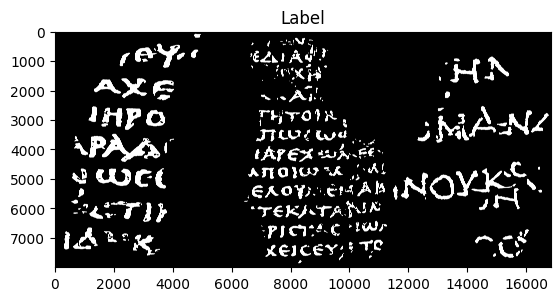

In [ ]:
''' labels '''
print(f'Label shape {labels_tensors.shape}')
fig, ax = plt.subplots()
ax.set_title('Label')
ax.imshow(labels_tensors, cmap='gray') #.cpu())
plt.show()

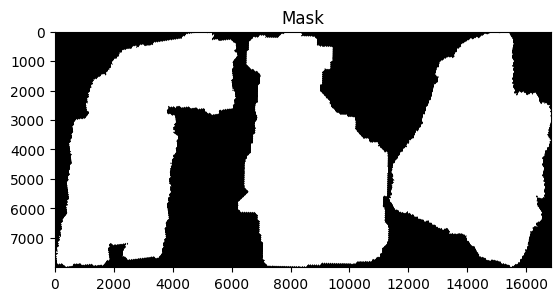

In [ ]:
''' masks '''
fig, ax = plt.subplots()
ax.set_title('Mask')
ax.imshow(masks_tensors, cmap='gray')
plt.show()

In [ ]:
buffer=15
validation_rectangle = (1100, 3500, 700, 950)
rectangle = validation_rectangle
not_border = np.zeros(masks_tensors.shape, dtype=bool)
not_border[buffer: masks_tensors.shape[0] - buffer,
           buffer: masks_tensors.shape[1] - buffer]  = True
array_mask = np.array(masks_tensors) * not_border
inside_rectangle = np.zeros(
          masks_tensors.shape, dtype=bool) * array_mask
inside_rectangle[rectangle[1]:rectangle[1] + rectangle[3] +1,
          rectangle[0]:rectangle[0] + rectangle[2] +1] = True
outside_rectangle = np.ones(
          masks_tensors.shape, dtype=bool) * array_mask
outside_rectangle[rectangle[1]:rectangle[1] + rectangle[3] + 1,
          rectangle[0]:rectangle[0] + rectangle[2] + 1] = False
pixels_inside_rectangle = np.argwhere(inside_rectangle)
pixels_outside_rectangle = np.argwhere(outside_rectangle)
del not_border ; del array_mask ; del inside_rectangle ;
del outside_rectangle ; del pixels_outside_rectangle

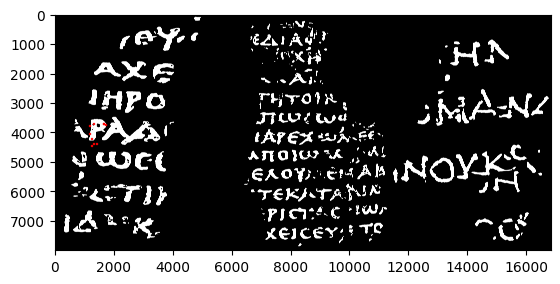

In [ ]:
buffer = 15
fig, ax = plt.subplots()
ax.imshow(labels_tensors, cmap='gray') #.cpu())
for i in range(10):
  patches_number = np.random.randint(
      1, len(pixels_inside_rectangle))
  x, y = pixels_inside_rectangle[patches_number]
  patch = patches.Rectangle([y - buffer, x - buffer], 2*buffer, 2*buffer,
                            edgecolor='r', facecolor='None')
  ax.add_patch(patch)
plt.show()

### Data Processing with NumPy

In [ ]:
''' approach with pytorch/monai of data processing and training pipeline

locate the directory with the image, mask pairs
sort images
define transformations
define array dataset, data loader
create a training data loader, and a validation data loader
create UNet, DiceLoss and Adam optimizer
work with a typical pytorch training
'''

In [ ]:
''' our approach with the image dataset

open the image slices, resize them, stack them as numpy array
prepare traing data loader, and validation data loader

ready to use images/slices/segments and labels
perform transformations for training/validation

define array dataset and dataloader
ArrayDataset(images, train_images, trainlabels, )
define data loader
DataLoader(check_dataset, batch_size, num_workers, pin_memory)
'''

In [ ]:
'''
An abstract class representing a Dataset

All datasets that represent a map from keys to data samples should subclass it.

All subclasses should overwrite __getitem__, supporting fetching a data sample
for a given key. Subclasses could also optionally overwrite __len__, which is
expected to return the size of the dataset by many ~torch.utils.data.Sampler
implementations and the default options of ~torch.utils.data.DataLoader

'''
class VesuviusDataset(Dataset):
  def __init__(self, image_stack, label, pixels, buffer, z_dimension):
    super().__init__()

    self.image_stack = image_stack
    self.label = label
    self.pixels = pixels
    self.buffer = buffer
    self.z_dimension = z_dimension

  def __getitem__(self, index):
    y, x = self.pixels[index]

    subvolume = self.image_stack[
      :, y - self.buffer: y + self.buffer +1, x - self.buffer: x + self.buffer +1
      ].view(1, self.z_dimension, self.buffer*2 +1, self.buffer*2 +1 )

    ink_label = self.label[y, x].view(1)
    return subvolume, ink_label
    # use this for visualization if need to use coordinates
    # return subvolume, ink_label, (y, x)

  def __len__(self):
    return len(self.pixels)

In [ ]:
class VesuviusDataset_Lit(pl.LightningDataModule):
  def __init__(self,
               buffer = 30,
               z_start = 27,
               z_dimension = 10,
               validation_rectangle = (1100, 3500, 700, 950),
               shared_height = 8000,
               downsampling = None,
               scroll_fragments = [1, 2, 3],
               stage = 'train',
               shuffle = True,
               batch_size = 32,
               num_workers = 4,
               on_gpu = False
      ):

      super().__init__()
      self.save_hyperparameters()

      self.buffer = buffer
      self.z_start = z_start
      self.num_workers = num_workers
      self.z_dimension = z_dimension
      self.validation_rectangle = validation_rectangle
      self.shared_height = shared_height
      self.downsampling = downsampling
      self.scroll_fragments = scroll_fragments
      self.stage = stage
      self.shuffle = shuffle
      self.batch_size = batch_size
      self.on_gpu = on_gpu
      self.prepare_data_per_node = True

  def prepare_data(self, *args, **kwargs):
    if self.stage == 'train':

      z_slices = [[] for i in range(len(self.scroll_fragments))]
      z_slices_tensors = [[] for i in range(len(self.scroll_fragments))]
      labels = [[] for i in range(len(self.scroll_fragments))]
      masks =  [[] for i in range(len(self.scroll_fragments))]

      ''' get z_slices .tif(s) files for scroll fragments [1, 2, 3]
          get labels, and masks for the scroll 1, 2, 3  '''
      for i in self.scroll_fragments:
        z_slices[i -1] += sorted(
            glob.glob(f'{PREFIX}train/{i}/surface_volume/*.tif'))[
                              self.z_start : self.z_start + self.z_dimension]
        labels[i -1] = self.load_labels('train', i) # np.array format
        masks[i -1] = self.load_masks('train', i)   # np.array format

      for i in range(len(self.scroll_fragments)):
          z_slices_tensors[i] = self.load_slices(z_slices[i]) # np.array format
      del z_slices
      images_tensors = torch.cat([image_ for image_ in z_slices_tensors],axis=-1)
      del z_slices_tensors
      labels_tensors = torch.cat([label_ for label_ in labels], axis=-1)
      del labels
      masks_tensors = np.concatenate([mask_ for mask_ in masks], axis=-1)
      del masks

      ''' obtain train and validation pixels
      pixels inside the rectangles are of the validation set,
      pixels outside of the rectangles belong to the train set '''
      train_pixels, validation_pixels = self.split_train_validate(masks_tensors)
      self.mask = masks_tensors

      ''' prepare data train and validation '''
      self.data_train = VesuviusDataset(
                            image_stack = images_tensors,
                            label = labels_tensors,
                            pixels = train_pixels,
                            buffer = self.buffer,
                            z_dimension = self.z_dimension)

      self.data_val = VesuviusDataset(image_stack = images_tensors,
                          label = labels_tensors, pixels = validation_pixels,
                          buffer = self.buffer, z_dimension = self.z_dimension)

      ''' memory management before returning '''
      del images_tensors ; del labels_tensors ;  del masks_tensors
      del train_pixels ; del validation_pixels

    elif self.stage == 'test':
      z_slices = [ [], [] ]
      '''
      for i, label_ in enumerate(['a', 'b']):
        z_slices[i] = sorted(
          glob.glob(f'{PREFIX}test/{label_}/surface_volume/*.tif'))
      '''

  def train_dataloader(self, *args, **kwargs):
    ''' constructor for train dataloader  '''
    return DataLoader(self.data_train, shuffle=True, batch_size=self.batch_size,
                      num_workers = self.num_workers, pin_memory = self.on_gpu)

  def test_dataloader(self, *args, **kwargs):
    ''' constructor for test dataloader  '''
    return DataLoader(self.data_test, shuffle=False, batch_size=self.batch_size,
                      num_workers = self.num_workers, pin_memory = self.on_gpu)

  def val_dataloader(self, *args, **kwargs):
    ''' constructor for validation dataloader  '''
    return DataLoader(self.data_val, shuffle=False, batch_size=self.batch_size,
                      num_workers = self.num_workers, pin_memory = self.on_gpu)

  def load_slices(self, z_slices_files):
    ''' we convert the batch of z_slices images into image tensors '''
    images_ = []
    for z, z_slice_file in tqdm(enumerate(z_slices_files)):
      image_ = Image.open(z_slice_file)
      image_ = self.image_resize(image_)
      image_arr = np.array(image_, dtype=float)/65535.0
      images_.append(image_arr)

    ''' use np.vstack or torch.stack for consistency with torch '''
    image_stack = torch.stack(
        [torch.from_numpy(image) for image in images_], dim=0) #.to(DEVICE)
    return  image_stack

  def load_labels(self, split, index):
    img_ = Image.open(f'{PREFIX}/{split}/{index}/inklabels.png')
    img_ = self.image_resize(img_)
    img_ = torch.from_numpy(np.array(img_)).gt(0).float() #.to(DEVICE)
    return img_

  def load_masks(self, split, index):
    img_ = Image.open(f'{PREFIX}/{split}/{index}/mask.png').convert('1')
    img_ = self.image_resize(img_)
    return np.array(img_)

  def split_train_validate(self, mask):
     rectangle = self.validation_rectangle               # 1250, 1500, 780, 850
     not_border = np.zeros(mask.shape, dtype=bool)
     not_border[self.buffer: mask.shape[0] - self.buffer,
                self.buffer: mask.shape[1] - self.buffer]  = True
     array_mask = np.array(mask) * not_border
     inside_rectangle = np.zeros(mask.shape, dtype=bool) * array_mask
     inside_rectangle[rectangle[1]:rectangle[1] + rectangle[3] +1,
                      rectangle[0]:rectangle[0] + rectangle[2] +1] = True
     outside_rectangle = np.ones(mask.shape, dtype=bool) * array_mask
     outside_rectangle[rectangle[1]:rectangle[1] + rectangle[3] + 1,
                       rectangle[0]:rectangle[0] + rectangle[2] + 1] = False
     pixels_inside_rectangle = np.argwhere(inside_rectangle)
     pixels_outside_rectangle = np.argwhere(outside_rectangle)

     return pixels_inside_rectangle, pixels_outside_rectangle

  def image_resize(self, image):
    actual_width, actual_height = image.size
    aspect_ratio = actual_width/actual_height
    new_width = int(self.shared_height * aspect_ratio)
    new_size = (new_width, self.shared_height)
    image = image.resize(new_size)
    return image


In [ ]:
scrolls_dataset = VesuviusDataset_Lit(
              buffer = 30,
              z_start = 27,
              z_dimension = 10,
              validation_rectangle = (1100, 3500, 700, 950),
              shared_height = 8000,
              downsampling = None,
              scroll_fragments = [1, 2, 3],
              stage = 'train',
              shuffle = True,
              batch_size = 8,
              num_workers = 4,
              on_gpu = False
)
scrolls_dataset.buffer, scrolls_dataset.batch_size

(30, 8)

In [ ]:
'''
train 1 folder the same as train 3 folder in size
train 2 is 50% larger in size than train 1 folder
train 1	(8181, 6330)	51785730
train 2	(14830, 9506)	140973980
train 3	(7606, 5249)	39923894

Need to check the data - start with batches of 20, and 30
'''
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
scrolls_dataset.prepare_data()

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:2918: DecompressionBombWarning: Image size (140973980 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
10it [00:22,  2.21s/it]
10it [00:34,  3.41s/it]
10it [00:19,  1.98s/it]


Image shape torch.Size([10, 8000, 16836])


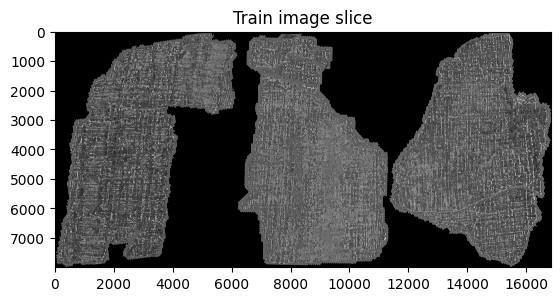

In [ ]:
''' Check the data '''

print(f'Image shape {scrolls_dataset.data_train.image_stack.shape}')
fig, ax = plt.subplots()
ax.set_title('Train image slice')
ax.imshow(scrolls_dataset.data_train.image_stack[6], cmap='gray') #.cpu()
plt.show()

Label shape torch.Size([8000, 16836])


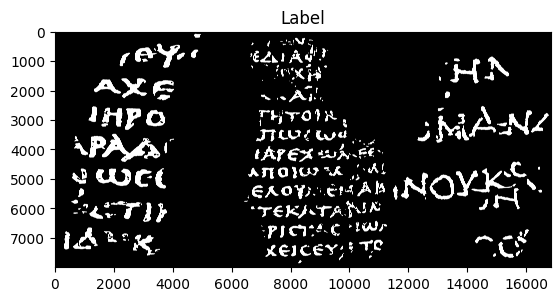

In [ ]:
print(f'Label shape {scrolls_dataset.data_train.label.shape}')
fig, ax = plt.subplots()
ax.set_title('Label')
ax.imshow(scrolls_dataset.data_train.label, cmap='gray') #.cpu())
plt.show()

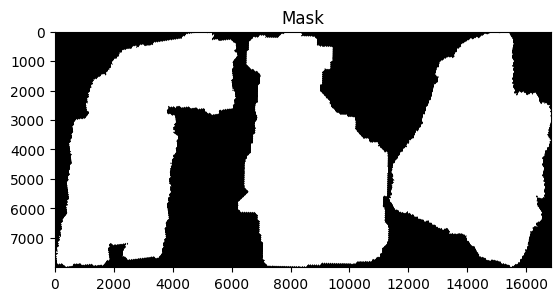

In [ ]:
fig, ax = plt.subplots()
ax.set_title('Mask')
ax.imshow(scrolls_dataset.mask, cmap='gray')
plt.show()

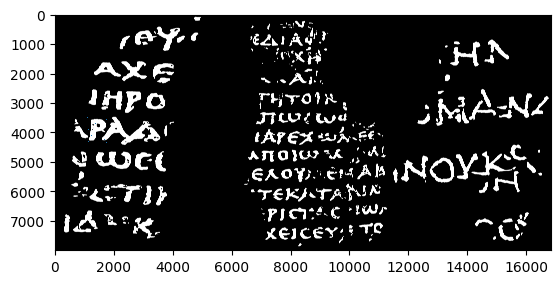

In [ ]:
''' Simulation to traverse the image in Pathes during training '''
buffer = 15
fig, ax = plt.subplots()
ax.imshow(scrolls_dataset.data_train.label, cmap='gray') #.cpu())
for i in range(10):
  patches_number = np.random.randint(1, len(scrolls_dataset.data_train.pixels))
  x, y = scrolls_dataset.data_train.pixels[patches_number]
  patch = patches.Rectangle([y - buffer, x - buffer], 2*buffer, 2*buffer)
  ax.add_patch(patch)
plt.show()

In [ ]:
''' test dataloader '''
scrolls_dataloader = iter(scrolls_dataset.train_dataloader())

scrolls_dataset.train_dataloader().batch_size, \
scrolls_dataset.train_dataloader().num_workers, \
scrolls_dataset.train_dataloader().prefetch_factor, \
scrolls_dataset.train_dataloader().pin_memory, \
scrolls_dataset.train_dataloader().dataset

(8, 4, 2, False, <__main__.VesuviusDataset at 0x7fcdb0e7b460>)

In [ ]:
gc.collect()

8753

In [ ]:
for i in range(2):
  subvolume, inklabel, pixels = next(scrolls_dataloader)
  print('sub-volume shape', subvolume.shape, end='\t')
  print('inklabel shape', inklabel.shape)
  print(pixels[0])
  print(inklabel[0], end='t')
  print(inklabel[0]==0)

sub-volume shape torch.Size([8, 1, 10, 61, 61])	inklabel shape torch.Size([8, 1])
tensor([3619, 4447, 4148, 3525, 4189, 3897, 4110, 4380])
tensor([0.])ttensor([True])
sub-volume shape torch.Size([8, 1, 10, 61, 61])	inklabel shape torch.Size([8, 1])
tensor([4176, 3669, 4254, 3570, 4031, 4387, 3745, 3695])
tensor([1.])ttensor([False])


In [ ]:
scrolls_dataset.mask, scrolls_dataset.data_train.label, \
scrolls_dataset.data_train.pixels, scrolls_dataset.data_train.image_stack.shape


(array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 tensor([[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]),
 array([[3500, 1100],
        [3500, 1101],
        [3500, 1102],
        ...,
        [4450, 1798],
        [4450, 1799],
        [4450, 1800]]),
 torch.Size([10, 8000, 16836]))

In [ ]:
''' data with ink '''
scrolls_dataset.data_train.label[5001, 2580], \
scrolls_dataset.data_train.pixels[180000], \
scrolls_dataset.data_train.pixels[180000][0].shape, \
scrolls_dataset.data_train.pixels[180000][1]

(tensor(0.), array([3756, 1644]), (), 1644)

In [ ]:
scrolls_dataset.data_train.__len__(),

(666651,)

In [ ]:
scrolls_dataset.data_train.pixels[0], scrolls_dataset.data_train.pixels[1]


(array([3500, 1100]), array([3500, 1101]))

In [ ]:
scrolls_dataset.data_train.image_stack.shape, \
scrolls_dataset.data_train.label.shape, \
scrolls_dataset.data_train.pixels.shape

(torch.Size([10, 8000, 16836]), torch.Size([8000, 16836]), (666651, 2))

In [ ]:
scrolls_dataset.data_train.pixels[560]

array([3500, 1660])

In [ ]:
dataloader_ = iter(scrolls_dataset.train_dataloader())
for i in range(1):
  subvolume, inklabel, pixels = next(dataloader_)

  print('subvolume', subvolume.shape)
  print('inklabel', inklabel.shape)
  print('inklabel', inklabel[0])
  print('inklabel', inklabel[0]==0)
  print('pixels[0]', pixels[0])
  print('pixels[1]', pixels[1])

subvolume torch.Size([8, 1, 10, 61, 61])
inklabel torch.Size([8, 1])
inklabel tensor([0.])
inklabel tensor([True])
pixels[0] tensor([3900, 3986, 3695, 3687, 4306, 4154, 3894, 4325])
pixels[1] tensor([1674, 1632, 1181, 1113, 1259, 1235, 1651, 1584])


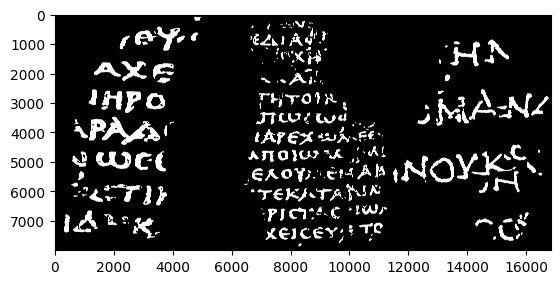

In [ ]:
dataloader_ = iter(scrolls_dataset.train_dataloader())
fig, ax = plt.subplots()
ax.imshow(scrolls_dataset.data_train.label, cmap='gray')
buffer=31
for i in range(30*100):
  subvolume, inklabel, pixels = next(dataloader_)
  x, y = pixels
  if inklabel[0] == 0:
    color = 'r'
  else:
    color = 'b'

  patch = patches.Rectangle([y -buffer, x -buffer], 2*buffer, 2*buffer +2)
  #ax.add_patch(patch)


### ResNet

In [ ]:
class Vesuvius_ResNet(nn.Module):
  def __init__(self,
               number_of_classes = 2,
               embedding_dimension = 128,
               z_dimension = None,
               buffer = None):
    super().__init__()

    self.num_classes = number_of_classes
    self.embedding_dim = embedding_dimension
    self.batch = 1
    self.batch_index = 1

    resnet_model = torchvision.models.video.r3d_18(weights=None)
    self.backbone = nn.Sequential(resnet_model.stem, resnet_model.layer1,
        resnet_model.layer2, resnet_model.layer3, resnet_model.layer4)

    self.output_dim = int(self.embedding_dim * math.ceil(
                            z_dimension/8) * (math.ceil(buffer*2 +1)/16)**2)
    self.bottleneck = nn.Conv3d(512, self.embedding_dim, 1)
    self.fc = nn.Linear(self.output_dim, self.num_classes)
    self.init_weights()

  def init_weights(self):
    range_init = 0.1
    self.fc.bias.data.zero_()
    self.fc.weight.data.uniform_(-range_init, range_init)
    nn.init.kaiming_normal_(
        self.bottleneck.weight.data, a=0, mode='fan_out', nonlinearity='relu')
    if self.bottleneck.bias is not None:
      _, fan_out = nn.init._calculate_fan_in_and_fan_out(
                                            self.bottleneck.weight.data)
      bound = 1 / math.sqrt(fan_out)
      nn.init.normal_(self.bottleneck.bias, -bound, bound)

  def forward(self, x):
    print(x.shape, x.shape[1])

    if x.shape[1] == 1:
      x = x.repeat(1, 3, 1, 1, 1)

    x = self.backbone(x.float())
    x = self.bottleneck(x)
    x = x.flatten(start_dim=1)
    output = self.fc
    return output


In [ ]:
buffer, z_dimension = 30, 10
embedding_dim = 128

resnet_model = torchvision.models.video.r3d_18(weights=None) # (pretrained=False)

backbone = nn.Sequential(
    resnet_model.stem,
    resnet_model.layer1,
    resnet_model.layer2,
    resnet_model.layer3,
    resnet_model.layer4)

output_dim = embedding_dim * math.ceil(
                        z_dimension/8) * (math.ceil(buffer*2 +1)/16)**2

bottleneck = nn.Conv3d(512, embedding_dim, 1)
fc = nn.Linear(int(output_dim), 2)
output_dim, bottleneck, fc


(3721.0,
 Conv3d(512, 128, kernel_size=(1, 1, 1), stride=(1, 1, 1)),
 Linear(in_features=3721, out_features=2, bias=True))

In [ ]:
fc.weight.data.uniform_(-0.1, 0.1), fc.weight.shape


(tensor([[-0.0699,  0.0857,  0.0134,  ...,  0.0531,  0.0409,  0.0426],
         [-0.0871, -0.0069,  0.0385,  ...,  0.0740, -0.0361,  0.0509]]),
 torch.Size([2, 3721]))

In [ ]:
resnet_model = Vesuvius_ResNet(
    number_of_classes=2,
    embedding_dimension = 128,
    z_dimension=10,
    buffer=31)


In [ ]:
fc.bias.data.zero_()


tensor([0., 0.])

In [ ]:
nn.init.kaiming_normal_(
    bottleneck.weight.data, a=0, mode='fan_out', nonlinearity='relu')


tensor([[[[[ 0.0122]]],


         [[[ 0.0142]]],


         [[[-0.0997]]],


         ...,


         [[[ 0.0079]]],


         [[[ 0.2820]]],


         [[[ 0.0069]]]],



        [[[[ 0.0667]]],


         [[[ 0.0571]]],


         [[[ 0.1309]]],


         ...,


         [[[ 0.0654]]],


         [[[-0.0142]]],


         [[[ 0.0544]]]],



        [[[[-0.0319]]],


         [[[-0.0640]]],


         [[[ 0.0335]]],


         ...,


         [[[ 0.0515]]],


         [[[-0.1429]]],


         [[[ 0.2227]]]],



        ...,



        [[[[-0.1588]]],


         [[[ 0.0567]]],


         [[[-0.0255]]],


         ...,


         [[[ 0.0227]]],


         [[[ 0.0042]]],


         [[[ 0.0409]]]],



        [[[[-0.0139]]],


         [[[-0.2387]]],


         [[[-0.0570]]],


         ...,


         [[[-0.0064]]],


         [[[ 0.1377]]],


         [[[ 0.0638]]]],



        [[[[-0.2864]]],


         [[[ 0.1790]]],


         [[[-0.0580]]],


         ...,


         [[[-0.1208]

In [ ]:
_, fan_out = nn.init._calculate_fan_in_and_fan_out(bottleneck.weight.data)
fan_out


128

In [ ]:
bound = 1 / math.sqrt(fan_out)
nn.init.normal_(bottleneck.bias, -bound, bound).shape, \
nn.init.normal_(bottleneck.bias, -bound, bound)


(torch.Size([128]),
 Parameter containing:
 tensor([-0.1039, -0.0919, -0.1356, -0.2489, -0.1177,  0.0238, -0.0826, -0.1960,
         -0.1282, -0.1199, -0.0265, -0.1643, -0.1345,  0.1337, -0.0348, -0.1934,
         -0.0642, -0.0662, -0.0051, -0.0112, -0.0998, -0.1164, -0.1368, -0.0743,
         -0.1507, -0.0409,  0.0059, -0.1422, -0.0368, -0.0633, -0.1826,  0.0832,
         -0.0497, -0.0710, -0.0406, -0.2008, -0.1457, -0.1041, -0.1465, -0.0796,
          0.0625, -0.1186, -0.2782, -0.1584, -0.1100, -0.0804, -0.0278,  0.0924,
         -0.0657, -0.0702, -0.0541, -0.0692, -0.0038, -0.2033, -0.2226, -0.0341,
         -0.1089, -0.2416, -0.0200, -0.0053, -0.0319, -0.0967, -0.0327, -0.2048,
         -0.0214, -0.0537, -0.2091, -0.1620, -0.2569, -0.1167, -0.1474,  0.0381,
         -0.1113, -0.2717, -0.0282, -0.0317, -0.0073, -0.1150,  0.0459, -0.0983,
          0.0647, -0.1722, -0.0903, -0.1293, -0.0843, -0.1482, -0.1426, -0.0940,
         -0.0579, -0.1206, -0.0880, -0.1493,  0.0553, -0.1436, -0.

In [ ]:
scrolls_dataset = VesuviusDataset_Lit(
              buffer = 31,
              z_start = 27,
              z_dimension = 10,
              validation_rectangle = (1100, 3500, 700, 950),
              shared_height = 8000,
              downsampling = None,
              scroll_fragments = [1, 2, 3],
              stage = 'train',
              shuffle = True,
              batch_size = 3,
              num_workers = 4,
              on_gpu = False
)


In [ ]:
scrolls_dataset.buffer, scrolls_dataset.batch_size


(31, 3)

In [ ]:
scrolls_dataset.prepare_data()

10it [00:10,  1.00s/it]
10it [00:20,  2.05s/it]
10it [00:10,  1.03s/it]


In [ ]:
train_tensor_shape = scrolls_dataset.data_train.image_stack.shape
train_tensor_img = scrolls_dataset.data_train.image_stack
train_tensor_label = scrolls_dataset.data_train.label
train_tensor_label = train_tensor_label.float()
train_tensor_shape, train_tensor_label.shape, train_tensor_label


(torch.Size([10, 8000, 16836]),
 torch.Size([8000, 16836]),
 tensor([[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]))

In [ ]:
scrolls_dataset.data_train.image_stack.shape, scrolls_dataset.data_train.label.shape, \
scrolls_dataset.data_train.pixels.shape


(torch.Size([10, 8000, 16836]), torch.Size([8000, 16836]), (666651, 2))

In [ ]:
resnet_model.modules

<bound method Module.modules of Vesuvius_ResNet(
  (backbone): Sequential(
    (0): BasicStem(
      (0): Conv3d(3, 64, kernel_size=(3, 7, 7), stride=(1, 2, 2), padding=(1, 3, 3), bias=False)
      (1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): BasicBlock(
        (conv1): Sequential(
          (0): Conv3DSimple(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
          (1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (conv2): Sequential(
          (0): Conv3DSimple(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
          (1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (relu): ReLU(inplace=True)
      )
      (1): BasicBlock(
        (conv1): Sequential(
          (0): Conv3DSim

In [ ]:
from torchvision import transforms
preprocess = transforms.Compose([transforms.ToTensor()])


In [ ]:
class Vesuvius_ResNet_Lit(pl.LightningModule):
  def __init__(self,
                model,
                learning_rate: float = 0.0003,
                weight_decay: float = 0.0005,
                milestones = [2, 4, 5, 6, 7, 9, 10, 12, 15, 17, 20, 25],
                gamma: float = 0.85):

    super().__init__()
    self.save_hyperparameters(ignore=['model'])
    self.learning_rate = learning_rate
    self.weight_decay = weight_decay
    self.milestones = milestones
    self.gamma = gamma
    self.model = model
    self.loss_fn = nn.CrossEntropyLoss()

  def forward(self, x):
    return self.model(x)

  def training_step(self, batch, batch_index):
    images, labels = batch

    loss = self.loss_fn(self.model(torch.squeeze(images, 1)), labels)

    self.log('train loss', loss) #, prog_bar)
    # prog_bar: if ``True`` logs to the progress bar. Log a key, value pair.
    outputs = {'loss': loss}
    return loss

  def validation_step(self, batch, batch_index):
    images, labels = batch

    loss = self.loss_fn(self.model(torch.squeeze(images, 1)), labels)

    self.log('validation loss', loss) #, prog_bar)
    outputs = {'loss': loss}
    return loss

  def test_step(self, batch, batch_index):
    images, targets = batch
    predictions = self.model.predict(images)
    test_errors = self.test_errors(predictions, targets)
    self.log('test errors', test_errors)
    return predictions

  def test_errors(self, predictions, targets):
    return

  def configure_optimizers(self):
    optimizer = torch.optim.AdamW(self.model.parameters(),
                lr=self.learning_rate, weight_decay = self.weight_decay)
    scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer,
                milestones = self.milestones, gamma = self.gamma)
    return [optimizer], [scheduler]


  def configure_optimizers_updated(self):
    optimizer = torch.optim.AdamW(self.model.parameters(),
                lr=self.learning_rate, weight_decay = self.weight_decay)
    scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer,
                milestones = self.milestones, gamma = self.gamma)
    scheduler = torch.optim.lr_scheduler.OneCycleLR(
                optimizer, max_lr = 0.001, total_steps=100)
    return [optimizer], [scheduler]


In [ ]:
resnet_lit_model = Vesuvius_ResNet_Lit(model=resnet_model)
resnet_lit_model.training_step, resnet_lit_model.forward, \
resnet_lit_model.configure_optimizers
print()


In [ ]:
trainer = pl.Trainer(
    accelerator='cpu',
    benchmark = True,
    max_epochs=1,
    devices=1,
    accumulate_grad_batches = 8
)
PATHTRAIN = f'/content/drive/MyDrive/A_Vesuvius/'


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [ ]:
resnet_lit_model.parameters


In [ ]:
''' 955 OF THE CODE in image procssing is reused - and there are formulas
based on dimensions for input/output channels

the version am looking at is more detailed and the same as it comes with pytorch and monai and pytorchio ""

In [ ]:
trainer.fit(resnet_lit_model, datamodule=scrolls_dataset)


### Data Processing with Pandas

In [ ]:
PREFIX = f'/content/drive/MyDrive/A_Vesuvius/'
sorted(glob.glob(f'{PREFIX}train/*/mask.png'))

['/content/drive/MyDrive/A_Vesuvius/train/1/mask.png',
 '/content/drive/MyDrive/A_Vesuvius/train/2/mask.png',
 '/content/drive/MyDrive/A_Vesuvius/train/3/mask.png']

In [ ]:
stage =['train', 'test']
downsampling = 'sampling'

In [ ]:
mask_files = sorted(glob.glob(f'{PREFIX}train/*/mask.png'))
label_files = sorted(glob.glob(f'{PREFIX}train/*/inklabels.png'))
surface_volume_files = sorted(glob.glob(f'{PREFIX}train/*/surface_volume/*.tif'))
surface_volumes = sorted(glob.glob(f'{PREFIX}train/*/surface_volume/'))
mask_files, label_files, surface_volumes, #surface_volume_files

(['/content/drive/MyDrive/A_Vesuvius/train/1/mask.png',
  '/content/drive/MyDrive/A_Vesuvius/train/2/mask.png',
  '/content/drive/MyDrive/A_Vesuvius/train/3/mask.png'],
 ['/content/drive/MyDrive/A_Vesuvius/train/1/inklabels.png',
  '/content/drive/MyDrive/A_Vesuvius/train/2/inklabels.png',
  '/content/drive/MyDrive/A_Vesuvius/train/3/inklabels.png'],
 ['/content/drive/MyDrive/A_Vesuvius/train/1/surface_volume/',
  '/content/drive/MyDrive/A_Vesuvius/train/2/surface_volume/',
  '/content/drive/MyDrive/A_Vesuvius/train/3/surface_volume/'])

In [ ]:
df = pd.DataFrame({'masks': mask_files,
                   'labels': label_files,
                   'volume_dir': surface_volumes })

df['masks'] = df['masks'].astype(str) # at element level and object
df['labels'] = df['labels'].astype(str)
df['surface_volumes'] = df['masks'].astype(str)

df['stage'] = df['masks'].str.split('/').str[-3]
df['fragment'] = df['masks'].str.split('/').str[-2]
df['stage'] , df['fragment']

(0    train
 1    train
 2    train
 Name: stage, dtype: object,
 0    1
 1    2
 2    3
 Name: fragment, dtype: object)

In [ ]:
df['masks_npy'] = df['masks'].str.replace('train', f'train_{downsampling}', regex=False)
df['masks_npy'] = df['masks_npy'].str.replace('png', 'npy', regex=False)
df['labels_npy'] = df['masks_npy'].str.replace('mask', 'inklabels', regex=False)
df['volume_npy'] = df['masks_npy'].str.replace('mask', 'volume', regex=False)

df['masks_npy'], df['labels_npy'] , df['volume_npy'], \
df['masks'][0], df['labels'][0], df['volume_dir'][0], \
df['masks_npy'][0], df['labels_npy'][0], df['volume_npy'][0]

(0    /content/drive/MyDrive/A_Vesuvius/train_sampli...
 1    /content/drive/MyDrive/A_Vesuvius/train_sampli...
 2    /content/drive/MyDrive/A_Vesuvius/train_sampli...
 Name: masks_npy, dtype: object,
 0    /content/drive/MyDrive/A_Vesuvius/train_sampli...
 1    /content/drive/MyDrive/A_Vesuvius/train_sampli...
 2    /content/drive/MyDrive/A_Vesuvius/train_sampli...
 Name: labels_npy, dtype: object,
 0    /content/drive/MyDrive/A_Vesuvius/train_sampli...
 1    /content/drive/MyDrive/A_Vesuvius/train_sampli...
 2    /content/drive/MyDrive/A_Vesuvius/train_sampli...
 Name: volume_npy, dtype: object,
 '/content/drive/MyDrive/A_Vesuvius/train/1/mask.png',
 '/content/drive/MyDrive/A_Vesuvius/train/1/inklabels.png',
 '/content/drive/MyDrive/A_Vesuvius/train/1/surface_volume/',
 '/content/drive/MyDrive/A_Vesuvius/train_sampling/1/mask.npy',
 '/content/drive/MyDrive/A_Vesuvius/train_sampling/1/inklabels.npy',
 '/content/drive/MyDrive/A_Vesuvius/train_sampling/1/volume.npy')

In [ ]:
''' data transformation '''
stage =['train', 'test']
downsampling = 'sampling'
mask_files = sorted(glob.glob(f'{PREFIX}train/*/mask.png'))
df1 = pd.DataFrame({'masks': mask_files})

df1['masks'] = df['masks'].astype(str)
df1['labels'] = df['masks'].str.replace('mask', 'inklabels', regex=False)
df1['volume_dir'] = df['masks'].str.replace('mask.png', 'surface_volume', regex=False)
df1

df1['train'] = df['masks'].str.split('/').str[-3]
df1['fragments'] = df['masks'].str.split('/').str[-2]

df1['masks_npy'] = df['masks'].str.replace('train', f'train_{downsampling}', regex=False)
df1['masks_npy'] = df['masks_npy'].str.replace('png', 'npy', regex=False)
df1['labels_npy'] = df['masks_npy'].str.replace('mask', 'inklabels', regex=False)
df1['volume_npy'] = df['masks_npy'].str.replace('mask', 'volume', regex=False)

,masks,labels,volume_dir
0,/content/drive/MyDrive/A_Vesuvius/train/1/mask...,/content/drive/MyDrive/A_Vesuvius/train/1/inkl...,/content/drive/MyDrive/A_Vesuvius/train/1/surf...
1,/content/drive/MyDrive/A_Vesuvius/train/2/mask...,/content/drive/MyDrive/A_Vesuvius/train/2/inkl...,/content/drive/MyDrive/A_Vesuvius/train/2/surf...
2,/content/drive/MyDrive/A_Vesuvius/train/3/mask...,/content/drive/MyDrive/A_Vesuvius/train/3/inkl...,/content/drive/MyDrive/A_Vesuvius/train/3/surf...


In [ ]:
del df

In [ ]:
def dataframe_from_path(stage, downsampling):
  all_mask_files = sorted(glob.glob(f'{PREFIX}{stage}/*/mask.png'))
  df = pd.DataFrame({'mask': all_mask_files})
  df['mask'] = df['mask'].astype(str)
  df[stage] = df['mask'].str.split('/').str[-3]
  df['fragment'] = df['mask'].str.split('/').str[-2]
  df['mask_npy'] = df['mask'].str.replace(stage, f'{stage}_{downsampling}', regex=False)
  df['mask_npy'] = df['mask_npy'].str.replace('png', 'npy', regex=False)

  if stage == 'train':
    df['label'] = df['mask'].str.replace('mask', 'inklabels', regex=False)
    df['label_npy'] = df['mask_npy'].str.replace('mask', 'inklabel', regex=False)

  df['volume_dir'] = df['mask'].str.replace('mask.png', 'surface_volume', regex=False)
  df['volume_npy'] = df['mask_npy'].str.replace('mask', 'volume', regex=False)

  return df

train_df = dataframe_from_path('train', 'sampling')
train_df

,mask,train,fragment,mask_npy,label,label_npy,volume_dir,volume_npy
0,/content/drive/MyDrive/A_Vesuvius/train/1/mask...,train,1,/content/drive/MyDrive/A_Vesuvius/train_sampli...,/content/drive/MyDrive/A_Vesuvius/train/1/inkl...,/content/drive/MyDrive/A_Vesuvius/train_sampli...,/content/drive/MyDrive/A_Vesuvius/train/1/surf...,/content/drive/MyDrive/A_Vesuvius/train_sampli...
1,/content/drive/MyDrive/A_Vesuvius/train/2/mask...,train,2,/content/drive/MyDrive/A_Vesuvius/train_sampli...,/content/drive/MyDrive/A_Vesuvius/train/2/inkl...,/content/drive/MyDrive/A_Vesuvius/train_sampli...,/content/drive/MyDrive/A_Vesuvius/train/2/surf...,/content/drive/MyDrive/A_Vesuvius/train_sampli...
2,/content/drive/MyDrive/A_Vesuvius/train/3/mask...,train,3,/content/drive/MyDrive/A_Vesuvius/train_sampli...,/content/drive/MyDrive/A_Vesuvius/train/3/inkl...,/content/drive/MyDrive/A_Vesuvius/train_sampli...,/content/drive/MyDrive/A_Vesuvius/train/3/surf...,/content/drive/MyDrive/A_Vesuvius/train_sampli...


In [ ]:
train_df['mask'][0], train_df['label'][0], train_df['volume_dir'][0], \
train_df['mask_npy'][0], train_df['label_npy'][0], train_df['volume_npy'][0]

('/content/drive/MyDrive/A_Vesuvius/train/1/mask.png',
 '/content/drive/MyDrive/A_Vesuvius/train/1/inklabels.png',
 '/content/drive/MyDrive/A_Vesuvius/train/1/surface_volume',
 '/content/drive/MyDrive/A_Vesuvius/train_sampling/1/mask.npy',
 '/content/drive/MyDrive/A_Vesuvius/train_sampling/1/inklabel.npy',
 '/content/drive/MyDrive/A_Vesuvius/train_sampling/1/volume.npy')

In [ ]:
train_df['mask'][0], train_df['train'][0], train_df['fragment'][0], \
train_df['mask_npy'][0], train_df['label'][0], train_df['label_npy'][0], \
train_df['volume_dir'][0], train_df['volume_npy'][0]


In [ ]:
val_df = dataframe_from_path('test', 'sampling')
val_df

,mask,test,fragment,mask_npy,volume_dir,volume_npy
0,/content/drive/MyDrive/A_Vesuvius/test/a/mask.png,test,a,/content/drive/MyDrive/A_Vesuvius/test_samplin...,/content/drive/MyDrive/A_Vesuvius/test/a/surfa...,/content/drive/MyDrive/A_Vesuvius/test_samplin...
1,/content/drive/MyDrive/A_Vesuvius/test/b/mask.png,test,b,/content/drive/MyDrive/A_Vesuvius/test_samplin...,/content/drive/MyDrive/A_Vesuvius/test/b/surfa...,/content/drive/MyDrive/A_Vesuvius/test_samplin...


In [ ]:
val_df['mask'][0], val_df['volume_dir'][0], \
val_df['mask'][1], val_df['volume_dir'][1], \
val_df['mask_npy'][1], val_df['volume_npy'][1]

In [ ]:
for row in tqdm(train_df.itertuples()):
  for i, item in enumerate(row):
    print(item)

3it [00:00, 361.04it/s]

0
/content/drive/MyDrive/A_Vesuvius/train/1/mask.png
train
1
/content/drive/MyDrive/A_Vesuvius/train_sampling/1/mask.npy
/content/drive/MyDrive/A_Vesuvius/train/1/inklabels.png
/content/drive/MyDrive/A_Vesuvius/train_sampling/1/inklabel.npy
/content/drive/MyDrive/A_Vesuvius/train/1/surface_volume
/content/drive/MyDrive/A_Vesuvius/train_sampling/1/volume.npy
1
/content/drive/MyDrive/A_Vesuvius/train/2/mask.png
train
2
/content/drive/MyDrive/A_Vesuvius/train_sampling/2/mask.npy
/content/drive/MyDrive/A_Vesuvius/train/2/inklabels.png
/content/drive/MyDrive/A_Vesuvius/train_sampling/2/inklabel.npy
/content/drive/MyDrive/A_Vesuvius/train/2/surface_volume
/content/drive/MyDrive/A_Vesuvius/train_sampling/2/volume.npy
2
/content/drive/MyDrive/A_Vesuvius/train/3/mask.png
train
3
/content/drive/MyDrive/A_Vesuvius/train_sampling/3/mask.npy
/content/drive/MyDrive/A_Vesuvius/train/3/inklabels.png
/content/drive/MyDrive/A_Vesuvius/train_sampling/3/inklabel.npy
/content/drive/MyDrive/A_Vesuvius/train

In [ ]:
def load_and_resize_image(path, downsampling):
  image = Image.open(path)
  size = int(image.size[0]*downsampling), int(image.size[1]*downsampling)
  return image.resize(size)
def load_z_slice_numpy(path, downsampling):
  z_slice = load_and_resize_image(path, downsampling)
  return np.array(z_slice, dtype=np.float32) / 65535.0
def load_label_numpy(path, downsampling):
  label = load_and_resize_image(path, downsampling)
  return np.array(label) > 0 #np.array(label).gt(0)
def load_mask_numpy(path, downsampling):
  mask = load_and_resize_image(path, downsampling).convert('1')
  return np.array(mask)

In [ ]:
''' paths of z_slices '''
z_slices_paths  = sorted(glob.glob(
              f'{PREFIX}/train/1/surface_volume/*.tif'))[65//2 -2:65//2 +2]
z_slices_paths


In [ ]:
''' sampling - take 3 slices for each iteration '''
batch_size = 5
path_batches = [z_slices_paths[i: i+ batch_size] \
                for i in range(0, len(z_slices_paths))]
path_batches


In [ ]:
def load_volume_numpy(volume_dir, num_z_slices, downsampling):
  mid = 65 // 2
  start_ = mid - num_z_slices // 2
  end_ = mid + num_z_slices // 2

  z_slices_paths = sorted(glob.glob(f'{volume_dir}/*.tif'))[start_:end_]
  batch_size = num_z_slices // 4
  path_batches = [z_slices_paths[i: i+ batch_size]
                  for i in range(0, len(z_slices_paths))]

  volumes = []
  for path_batch in tqdm(
      path_batches, leave=False, desc ='processing-batches', position=1):
        z_slices = [load_z_slice_numpy(path, downsampling) for path in tqdm(
            path_batch, leave=False, desc ='processing-batches', position=1)]
        volumes.append(np.stack(z_slices, axis=0))
  volume = np.concatenate(volumes, axis=0)
  return volume


In [ ]:
volume_dir_ = '/content/drive/MyDrive/A_Vesuvius/train/1/surface_volume/'
volumes_1 = load_volume_numpy(volume_dir_, 8, 1)



processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.08it/s]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.20it/s]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.34it/s]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.45it/s]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.37it/s]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.37it/s]
                                                                 
processing-batches: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]
         

In [ ]:
volumes_1.shape

(15, 8181, 6330)

In [ ]:
volume_dir_ = '/content/drive/MyDrive/A_Vesuvius/train/2/surface_volume/'
volumes_2 = load_volume_numpy(volume_dir_, 8, 1)



processing-batches:   0%|          | 0/2 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:2918: DecompressionBombWarning: Image size (140973980 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(

processing-batches: 100%|██████████| 2/2 [00:17<00:00,  9.34s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:11<00:00,  5.50s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:04<00:00,  2.56s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:04<00:00,  2.32s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:04<00:00,  2.52s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:04<00:00,  2.60s/it]
         

In [ ]:
gc.collect()

120

In [ ]:
volume_dir_ = '/content/drive/MyDrive/A_Vesuvius/test/a/surface_volume/'
volumes_1_test = load_volume_numpy(volume_dir_, 8, 1)



processing-batches: 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.37it/s]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.62it/s]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.25it/s]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:00<00:00,  1.87it/s]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.12it/s]
                                                                 
processing-batches: 100%|██████████| 1/1 [00:00<00:00,  6.75it/s]
         

In [ ]:
volume_dir_ = '/content/drive/MyDrive/A_Vesuvius/test/b/surface_volume/'
volumes_2_test = load_volume_numpy(volume_dir_, 8, 1)



processing-batches: 100%|██████████| 2/2 [00:04<00:00,  2.05s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:04<00:00,  2.61s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:02<00:00,  1.34s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:03<00:00,  2.06s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:04<00:00,  2.59s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:04<00:00,  2.51s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.00it/s]
                                                                 
processing-batches: 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]
         

In [ ]:
volumes_1.shape, volumes_2.shape

((15, 8181, 6330), (15, 14830, 9506))

In [ ]:
volumes_1_test.shape, volumes_2_test.shape

((15, 2727, 6330), (15, 5454, 6330))

In [ ]:
import pathlib
from pathlib import Path
path = '/content/drive/MyDrive/A_Vesuvius/'

data_train_path = f'{path}/data_train.csv'
data_val_path = f'{path}/data_val.csv'

In [ ]:
m_t = '/content/drive/MyDrive/A_Vesuvius/train_sampling/1/mask.npy'
Path(m_t), Path(m_t).parent.mkdir(exist_ok=True, parents=True)


(PosixPath('/content/drive/MyDrive/A_Vesuvius/train_sampling/1/mask.npy'),
 None)

In [ ]:
next(train_df.itertuples())

Pandas(Index=0, mask='/content/drive/MyDrive/A_Vesuvius/train/1/mask.png', train='train', fragment='1', mask_npy='/content/drive/MyDrive/A_Vesuvius/train_sampling/1/mask.npy', label='/content/drive/MyDrive/A_Vesuvius/train/1/inklabels.png', label_npy='/content/drive/MyDrive/A_Vesuvius/train_sampling/1/inklabel.npy', volume_dir='/content/drive/MyDrive/A_Vesuvius/train/1/surface_volume', volume_npy='/content/drive/MyDrive/A_Vesuvius/train_sampling/1/volume.npy')

In [ ]:
for row in tqdm(train_df.itertuples()):
  print(row.label, row.label_npy, row.volume_dir, row.volume_npy)

3it [00:00, 7476.48it/s]

/content/drive/MyDrive/A_Vesuvius/train/1/inklabels.png /content/drive/MyDrive/A_Vesuvius/train_sampling/1/inklabel.npy /content/drive/MyDrive/A_Vesuvius/train/1/surface_volume /content/drive/MyDrive/A_Vesuvius/train_sampling/1/volume.npy
/content/drive/MyDrive/A_Vesuvius/train/2/inklabels.png /content/drive/MyDrive/A_Vesuvius/train_sampling/2/inklabel.npy /content/drive/MyDrive/A_Vesuvius/train/2/surface_volume /content/drive/MyDrive/A_Vesuvius/train_sampling/2/volume.npy
/content/drive/MyDrive/A_Vesuvius/train/3/inklabels.png /content/drive/MyDrive/A_Vesuvius/train_sampling/3/inklabel.npy /content/drive/MyDrive/A_Vesuvius/train/3/surface_volume /content/drive/MyDrive/A_Vesuvius/train_sampling/3/volume.npy


In [ ]:
def dataframe_as_numpy(df, num_z_slices, downsampling, train=True):
  for row in tqdm(
      df.itertuples(), total=len(df), desc ='processing-fragments', position =0):
    mask_npy = load_mask_numpy(row.mask, downsampling)
    volume_npy = load_volume_numpy(row.volume_dir, num_z_slices, downsampling)
    #Path(row.mask_npy).parent.mkdir(exist_ok=True, parent=True)
    np.save(row.mask_npy, mask_npy)
    np.save(row.volume_npy, volume_npy)
    if train:
      label_npy = load_label_numpy(row.label, downsampling)
      np.save(row.label_npy, label_npy)
    tqdm.write(f'Created {row.volume_npy} with shape {volume_npy.shape}')


In [ ]:
dataframe_as_numpy(train_df, 8, 1, train=True)


processing-batches: 100%|██████████| 2/2 [00:11<00:00,  6.20s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:02<00:00,  1.55s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:02<00:00,  1.53s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:02<00:00,  1.39s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:02<00:00,  1.30s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:03<00:00,  2.16s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:03<00:00,  2.21s/it]
                                                                 
processing-batches: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]
          

Created /content/drive/MyDrive/A_Vesuvius/train_sampling/1/volume.npy with shape (15, 8181, 6330)


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:2918: DecompressionBombWarning: Image size (140973980 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(

processing-batches: 100%|██████████| 2/2 [00:11<00:00,  5.85s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:13<00:00,  7.10s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:23<00:00, 12.70s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:12<00:00,  6.25s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:08<00:00,  4.63s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:06<00:00,  3.34s/it]
                                                                 
p

Created /content/drive/MyDrive/A_Vesuvius/train_sampling/2/volume.npy with shape (15, 14830, 9506)



processing-batches: 100%|██████████| 2/2 [00:04<00:00,  2.15s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.04it/s]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:02<00:00,  1.19s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.10s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.09s/it]
                                                                 
processing-batches: 100%|██████████| 2/2 [00:01<00:00,  1.11s/it]
                                                                 
processing-batches: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]
         

Created /content/drive/MyDrive/A_Vesuvius/train_sampling/3/volume.npy with shape (15, 7606, 5249)


In [ ]:
dataframe_as_numpy(val_df, 8, 1, train=False)

In [ ]:
volumes_1, volumes_2 = None, None # release memory


In [ ]:
volumes_1_test, volumes_2_test = None, None # release memory
gc.collect()


602

In [ ]:
data_train_path,  data_val_path


('/content/drive/MyDrive/A_Vesuvius//data_train.csv',
 '/content/drive/MyDrive/A_Vesuvius//data_val.csv')

In [ ]:
f'{path}/train/1/*.csv'
!ls /content/drive/MyDrive/A_Vesuvius/train/1/*.csv


/content/drive/MyDrive/A_Vesuvius/train/1/inklabels_rle.csv


In [ ]:
!head /content/drive/MyDrive/A_Vesuvius/train/1/inklabels_rle.csv


Id,Predicted
1,606211 19 612538 26 618867 39 625196 44 631525 65 637854 70 644183 75 644309 16 650512 80 650635 24 656841 160 657011 14 663170 189 669499 192 675828 196 682157 198 688485 201 694812 205 701141 207 707469 209 713798 210 720127 212 726456 213 732785 214 739114 215 745443 216 751772 217 758101 218 764430 219 770759 220 777088 221 783417 222 789746 223 796075 224 802404 224 808733 225 815063 225 821393 225 827722 225 834052 224 840382 224 846712 223 853042 222 859372 221 865702 220 872032 219 878362 218 884692 217 891023 215 897353 214 903683 213 910014 212 916345 211 922675 211 929006 210 935336 210 941666 210 947996 210 954326 210 960656 210 966987 209 973317 209 979647 209 985977 208 992308 207 998638 207 1004968 206 1011298 205 1017628 205 1023958 204 1030288 204 1036618 204 1042948 204 1049278 203 1055608 203 1061938 203 1068268 203 1074598 202 1080928 202 1087258 202 1093588 202 1099918 202 1106249 201 1112580 200 1118910 200 1125240 200 1131571 199 1137902 198 114423

In [ ]:
data_train_path = f'{path}data_train.csv'
data_train_path


'/content/drive/MyDrive/A_Vesuvius/data_train.csv'

In [ ]:
class DataFrameDataset(pl.LightningDataModule):
  def __init__(self,
               patch_size = 512,
               z_start = 0,
               z_dimension = 64,
               shared_height = None,
               downsampling = None,
               train_fragment = [1, 2], # [1, 2, 3],
               val_fragment = [3],
               stage = 'train',
               batch_size = 1,
               num_samples = 1,
               num_workers = 0,
               on_gpu = False,
               data_path = data_train_path):

    super().__init__()
    self.save_hyperparameters()

    self.df = pd.read_csv(
        data_path, names=['mask', 'stage', 'fragment_id', 'mask_npy',
                          'label', 'label_npy', 'volume_dir', 'volume_npy'])
    self.keys = ('volume_npy', 'mask_npy', 'label_npy')

    self.train_transform = self.train_transforms()
    self.val_transform = self.val_transforms()
    self.predict_transform = self.predict_transforms()

  def setup(self, stage=None):
    if stage == 'fit' or stage is None:
      train_val_df = self.df[self.df.stage == 'train'].reset_index(drop=True)

      train_df = train_val_df[
          train_val_df.fragment_id != self.hparams.val_fragment[0]].reset_index(drop=True)
      self.train_dataset = self._dataset(train_df, self.train_transform)
      del train_df

      val_df =  train_val_df[
        train_val_df.fragment_id == self.hparams.val_fragment[0]].reset_index(drop=True)
      self.val_dataset = self._dataset(val_df, self.val_transform)
      del val_df

      del train_val_df

    if stage == 'predict' or stage is None:
      predict_df = self.df[self.df.stage == 'test'].reset_index(drop=True)

      self.predict_dataset = self._dataset(predict_df, self.predict_transform)
      del predict_df

  def _dataset(self, df, transform):
    return CSVDataset(src = df, transform = transform)

  def train_transforms(self):
    return monai.transforms.Compose([
      monai.transforms.LoadImaged(keys = 'volume_npy'),
      monai.transforms.LoadImaged(
        keys = ('mask_npy', 'label_npy'), ensure_channel_first = True),
      monai.transforms.RandWeightedCropd(
        keys = ('volume_npy', 'mask_npy', 'label_npy'),
        spatial_size = self.hparams.patch_size,
        num_samples = self.hparams.num_samples,
        w_key = 'mask_npy'),
      monai.transforms.RandFlipd(
        keys = self.keys, prob=0.5, spatial_axis = 0),
      monai.transforms.RandFlipd(
        keys = self.keys, prob=0.5, spatial_axis = 1),
    ])

  def val_transforms(self):
    return monai.transforms.Compose([
      monai.transforms.LoadImaged(keys = 'volume_npy'),
      monai.transforms.LoadImaged(
        keys = ('mask_npy', 'label_npy'), ensure_channel_first=True),
      monai.transforms.RandWeightedCropd(
        keys = ('volume_npy', 'mask_npy', 'label_npy'),
        spatial_size = self.hparams.patch_size,
        num_samples = self.hparams.num_samples,
        w_key = 'mask_npy'),
    ])

  def predict_transforms(self):
    return monai.transforms.Compose([
      monai.transforms.LoadImaged(keys = 'volume_npy'),
      monai.transforms.LoadImaged(keys = 'mask_npy', ensure_channel_first=True)
    ])

  def train_dataloader(self):
    return self._dataloader(self.train_dataset, train=True)

  def val_dataloader(self):
    return self._dataloader(self.val_dataset)

  def predict_dataloader(self):
    return self._dataloader(self.predict_dataset)

  def _dataloader(self, dataset, train=False):
    return DataLoader(
        dataset,
        batch_size = self.hparams.batch_size,
        shuffle=train,
        num_workers = self.hparams.num_workers
        #batch_size=1, shuffle=False, num_workers=8,
        #pin_memory=True, collate_fn=list_data_collate,
    )


In [ ]:
data_module = DataFrameDataset(
    batch_size=1,
    z_dimension=32,
    num_workers=4,
    num_samples=16,
    patch_size=(512, 512),
    data_path = data_train_path
)

/usr/local/lib/python3.10/dist-packages/monai/utils/deprecate_utils.py:321: FutureWarning: monai.transforms.io.dictionary LoadImaged.__init__:image_only: Current default value of argument `image_only=False` has been deprecated since version 1.1. It will be changed to `image_only=True` in version 1.3.
  warn_deprecated(argname, msg, warning_category)


In [ ]:
data_module_test = DataFrameDataset(
    batch_size=1,
    z_dimension=32,
    num_workers=4,
    num_samples=16,
    patch_size=(512, 512),
    data_path = data_val_path
)

/usr/local/lib/python3.10/dist-packages/monai/utils/deprecate_utils.py:321: FutureWarning: monai.transforms.io.dictionary LoadImaged.__init__:image_only: Current default value of argument `image_only=False` has been deprecated since version 1.1. It will be changed to `image_only=True` in version 1.3.
  warn_deprecated(argname, msg, warning_category)


In [ ]:
data_module.df[
    data_module.df.fragment_id != data_module.hparams.val_fragment[0]]

,mask,stage,fragment_id,mask_npy,label,label_npy,volume_dir,volume_npy
0,/content/drive/MyDrive/A_Vesuvius/train/1/mask...,train,1,/content/drive/MyDrive/A_Vesuvius/train_sampli...,/content/drive/MyDrive/A_Vesuvius/train/1/inkl...,/content/drive/MyDrive/A_Vesuvius/train_sampli...,/content/drive/MyDrive/A_Vesuvius/train/1/surf...,/content/drive/MyDrive/A_Vesuvius/train_sampli...
1,/content/drive/MyDrive/A_Vesuvius/train/2/mask...,train,2,/content/drive/MyDrive/A_Vesuvius/train_sampli...,/content/drive/MyDrive/A_Vesuvius/train/2/inkl...,/content/drive/MyDrive/A_Vesuvius/train_sampli...,/content/drive/MyDrive/A_Vesuvius/train/2/surf...,/content/drive/MyDrive/A_Vesuvius/train_sampli...


In [ ]:
data_module.df[
    data_module.df.fragment_id == data_module.hparams.val_fragment[0]]

,mask,stage,fragment_id,mask_npy,label,label_npy,volume_dir,volume_npy
2,/content/drive/MyDrive/A_Vesuvius/train/3/mask...,train,3,/content/drive/MyDrive/A_Vesuvius/train_sampli...,/content/drive/MyDrive/A_Vesuvius/train/3/inkl...,/content/drive/MyDrive/A_Vesuvius/train_sampli...,/content/drive/MyDrive/A_Vesuvius/train/3/surf...,/content/drive/MyDrive/A_Vesuvius/train_sampli...


In [ ]:
data_module_test.df[
    data_module_test.df.fragment_id == 'a']

,,,mask,stage,fragment_id,mask_npy,label,label_npy,volume_dir,volume_npy
/content/drive/MyDrive/A_Vesuvius/test/a/mask.png,test,a,/content/drive/MyDrive/A_Vesuvius/test_samplin...,test,a,/content/drive/MyDrive/A_Vesuvius/test_samplin...,/content/drive/MyDrive/A_Vesuvius/test/a/inkla...,/content/drive/MyDrive/A_Vesuvius/test_samplin...,/content/drive/MyDrive/A_Vesuvius/test/a/surfa...,/content/drive/MyDrive/A_Vesuvius/test_samplin...


In [ ]:
data_module_test.df[
    data_module_test.df.fragment_id == 'b']

,,,mask,stage,fragment_id,mask_npy,label,label_npy,volume_dir,volume_npy
/content/drive/MyDrive/A_Vesuvius/test/b/mask.png,test,b,/content/drive/MyDrive/A_Vesuvius/test_samplin...,test,b,/content/drive/MyDrive/A_Vesuvius/test_samplin...,/content/drive/MyDrive/A_Vesuvius/test/b/inkla...,/content/drive/MyDrive/A_Vesuvius/test_samplin...,/content/drive/MyDrive/A_Vesuvius/test/b/surfa...,/content/drive/MyDrive/A_Vesuvius/test_samplin...


In [ ]:
data_module.setup('fit')

In [ ]:
data_module.setup('predict')

In [ ]:
data_module.train_dataset, data_module.val_dataset, data_module.predict_dataset

(<monai.data.dataset.CSVDataset at 0x7f2619024850>,
 <monai.data.dataset.CSVDataset at 0x7f2619026470>)

In [ ]:
data_module.train_dataloader(), data_module.val_dataloader(), \
data_module.predict_dataloader()


(<monai.data.dataloader.DataLoader at 0x7f26190264d0>,
 <monai.data.dataloader.DataLoader at 0x7f26190251b0>)

In [ ]:
d_loader = data_module.train_dataloader()
for index, item in enumerate(d_loader):
  if index ==1: break
  volumes = item['volume_npy']
  print(volumes.shape)

torch.Size([16, 15, 512, 512])


In [ ]:
dataloaders = {
    'train': data_module.train_dataloader(),
    'val': data_module.val_dataloader()
}
dataloaders

{'train': <monai.data.dataloader.DataLoader at 0x7f2619006c20>,
 'val': <monai.data.dataloader.DataLoader at 0x7f2619005cc0>}

In [ ]:
train=True
from monai.visualize import matshow3d

for stage, dataloader in dataloaders.items():
  for index, item in enumerate(data_module.train_dataloader()):
    volumes = item['volume_npy']
    masks = item['mask_npy']
    if train:
      labels = item['label_npy']
    else:
      labels = masks

<ipython-input-126-69baf70ac804>:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax_ = plt.subplots(1, 3, figsize=(15, 5))


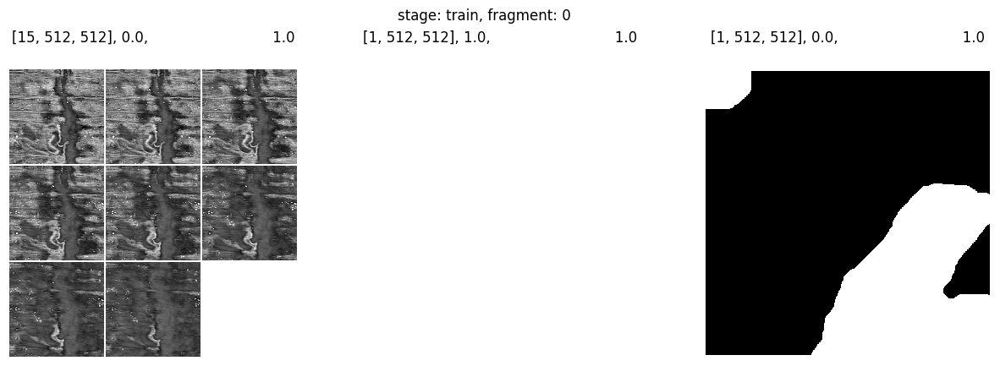

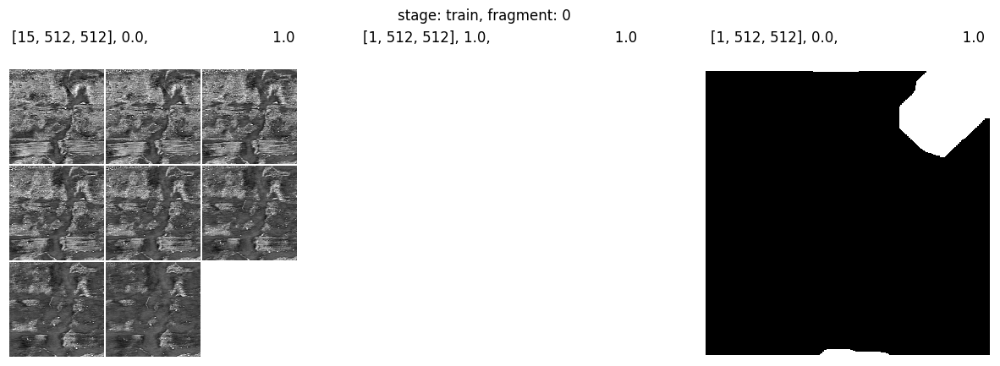

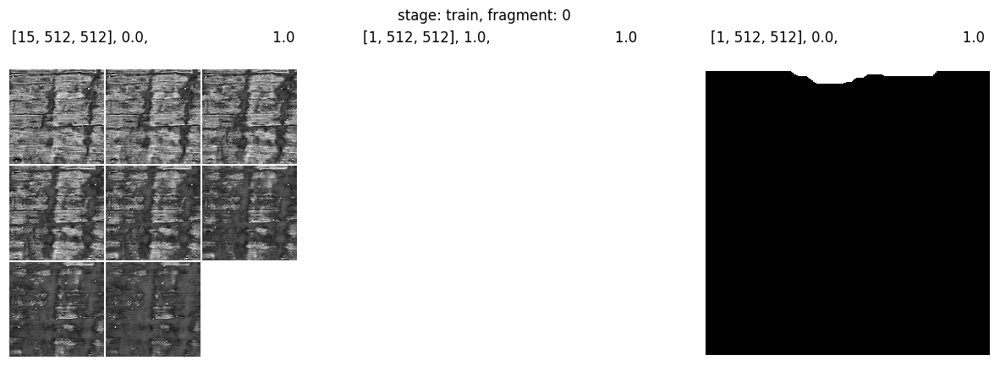

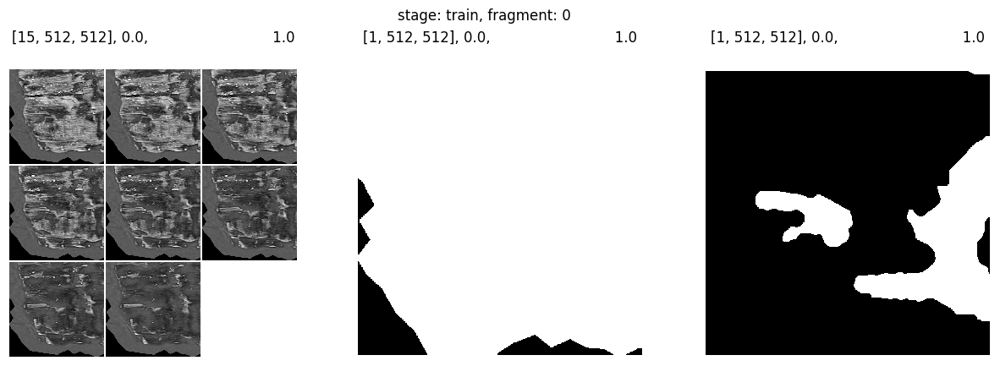

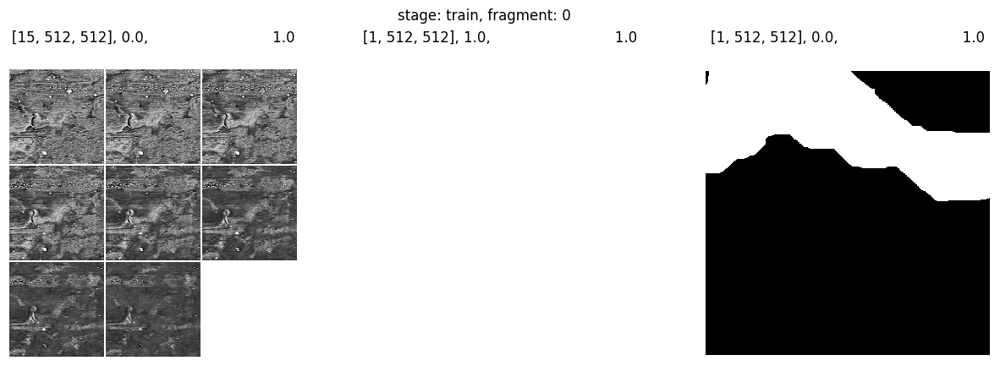

...

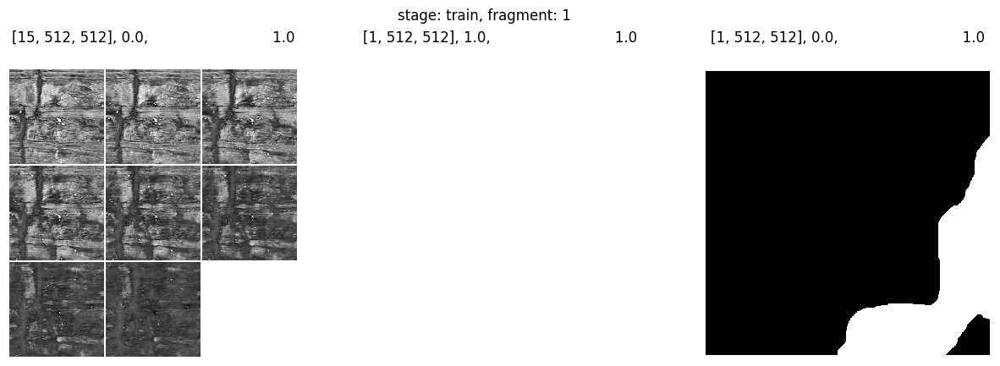

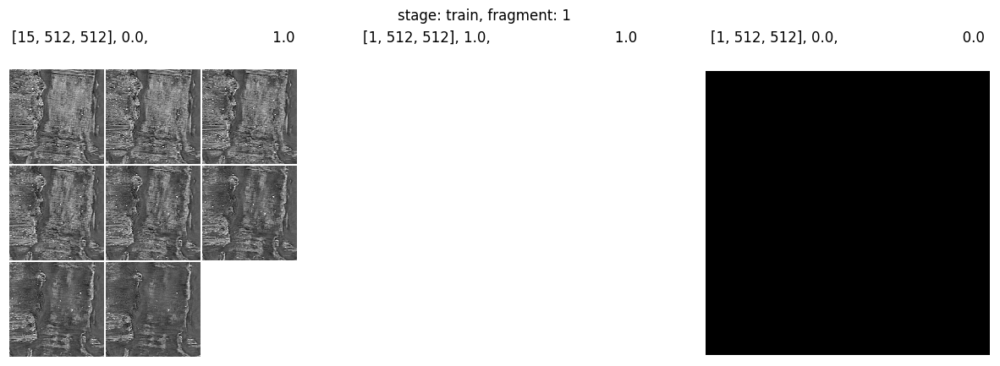

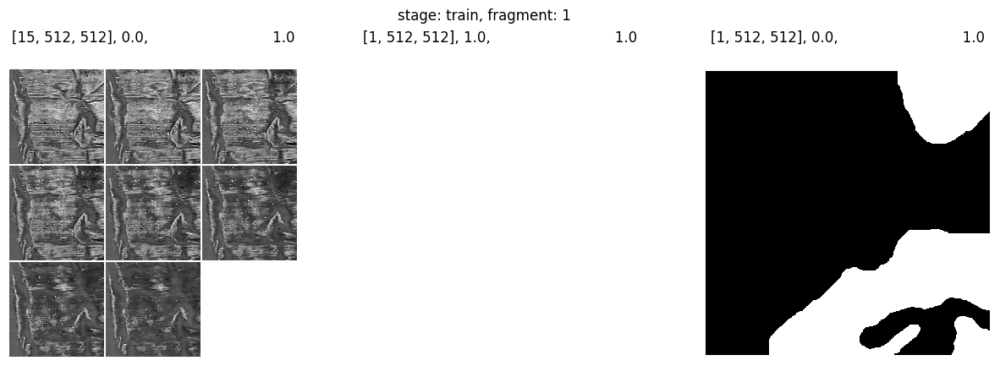

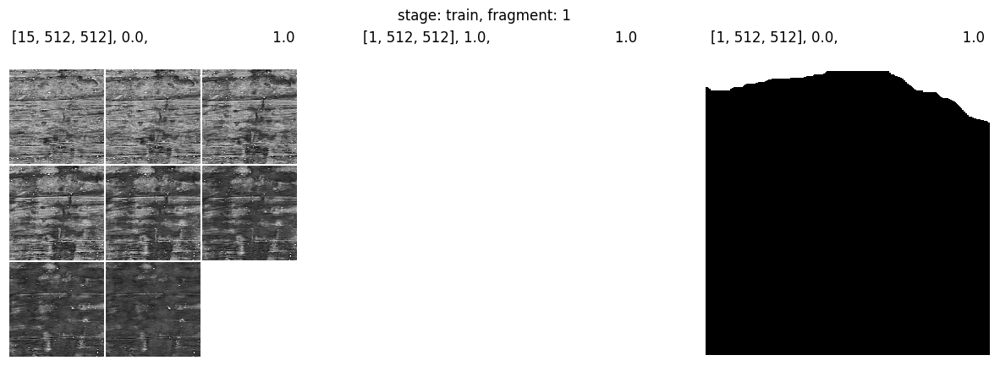

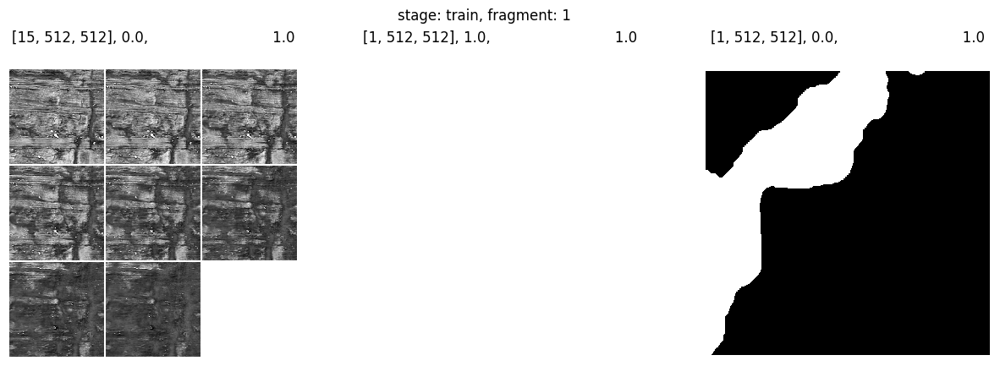

In [ ]:
train=True
from monai.visualize import matshow3d

for stage, dataloader in dataloaders.items():
  for index, item in enumerate(data_module.train_dataloader()):
    volumes = item['volume_npy']
    masks = item['mask_npy']
    if train:
      labels = item['label_npy']
    else:
      labels = masks

    for volume, mask, label in zip(volumes, masks, labels):
      fig, ax_ = plt.subplots(1, 3, figsize=(15, 5))
      plt.suptitle(f'stage: train, fragment: {index}')
      for idx, image in enumerate((volume, mask, label)):
        matshow3d(
            volume = image, fig = ax_[idx],
            title = f'{list(image.shape)}, {image.min().item()}, \
                           {image.max().item()}' ,
            vmin = 0.0, vmax = 1.0, every_n = 2, fill_value = 1.0 ,
            margin=4, cmap='gray'
        )


In [ ]:
data_module.val_dataloader()

In [ ]:
volumes.shape

torch.Size([16, 15, 512, 512])

In [ ]:
'''
An abstract class representing Dataset
Same implementation as above with changes for a separate model
'''
class VesuviusDataset_U(Dataset):
  def __init__(self, image_stack, label, pixels, buffer, z_dimension):
    super().__init__()

    self.image_stack = image_stack
    self.label = label
    self.pixels = pixels
    self.buffer = buffer
    self.z_dimension = z_dimension

  def __getitem__(self, index):
    y, x = self.pixels[index]

    subvolume = self.image_stack[
      :, y - self.buffer: y + self.buffer +1, x - self.buffer: x + self.buffer+1
    ].view(1, self.z_dimension, self.buffer*2 +1, self.buffer*2 +1)

    ink_label = self.label[
      y - self.buffer: y + self.buffer +1, x - self.buffer: x + self.buffer+1
    ].view(1, self.buffer*2 +1, self.buffer*2 +1)

    mask = self.mask[
      y - self.buffer: y + self.buffer +1, x - self.buffer: x + self.buffer+1
    ].view(1, self.buffer*2 +1, self.buffer*2 +1)

    return subvolume, ink_label, mask

  def __len__(self):
    return len(self.pixels)


In [ ]:
PATCH_SIZE = 224
z_dim = 24
class Configuration:
  train_fragment = [1, 2], # [1, 2, 3],
  val_fragment = [3],
  batch_size = 32,
  patch_size = PATCH_SIZE,
  z_dim = 16,
  stride = PATCH_SIZE//2,
  num_workers = 8, #16
  on_gpu = True,
  test_fragment = ['a', 'b']

Configuration.z_dim

(16,)

In [ ]:
class VesuviusDataset_Tile(Dataset):
  def __init__(self, images, labels=None, masks=None, transform=None):
    self.images = images
    self.labels = labels
    self.masks = masks
    self.transform = transform

  def __getitem__(self, index):
    image = self.images[idx]
    label = self.labels[idx]
    #mask = self.masks[idx]
    #masks_set = [label, mask]

    if self.transform:
      data = self.transform[image, label] # image = image, mask = label
      image = data['image']
      label = data['mask']

    return image, label

  def __len__(self):
    return len(self.image_stack)

In [ ]:
class VesuviusDataset_Lit_UNet(pl.LightningDataModule):
  def __init__(self,
               patch_size = 512,
               #buffer = 30,
               z_start = 27,
               z_dimension = 10,
               validation_rectangle = (1100, 3500, 700, 950),
               shared_height = 8000,
               downsampling = None,
               #scroll_fragments = [1, 2, 3],
               train_scroll_fragments = [1, 2],
               val_scroll_fragments = [3],
               stage = 'train',
               #shuffle = True,
               batch_size = 8, #32
               num_workers = 4,
               on_gpu = False
      ):

      super().__init__()
      self.save_hyperparameters()

      self.patch_size = patch_size,
      self.z_start = z_start
      self.z_dimension = z_dimension
      self.validation_rectangle = validation_rectangle
      self.downsampling = downsampling
      self.train_scroll_fragments = train_scroll_fragments
      self.val_scroll_fragments = val_scroll_fragments
      self.num_workers = num_workers
      self.stage = stage
      self.shared_height = shared_height
      self.batch_size = batch_size
      self.on_gpu = on_gpu
      self.prepare_data_per_node = True

  def prepare_data(self, *args, **kwargs):
    if self.stage == 'train':

      z_slices = [[] for i in range(len(self.scroll_fragments))]
      labels = [[] for i in range(len(self.scroll_fragments))]
      masks =  [[] for i in range(len(self.scroll_fragments))]

      z_slices_val = [[] for i in range(len(self.scroll_fragments))]
      labels_val = [[] for i in range(len(self.scroll_fragments))]
      masks_val =  [[] for i in range(len(self.scroll_fragments))]

      """ get z_slices .tif(s) files for scroll fragments [1, 2, 3]
          get labels, and masks for the scroll 1, 2, 3  """
      for i in self.train_scroll_fragments:
        z_slices[i -1] += sorted(
            glob.glob(f'{path}train/{i}/surface_volume/*.tif'))[
                              self.z_start : self.z_start + self.z_dimension]
        labels[i -1] = self.load_labels('train', i)
        masks[i -1] = self.load_masks('train', i)

      for i in self.val_scroll_fragments:
        z_slices_val[i -1] += sorted(
            glob.glob(f'{path}train/{i}/surface_volume/*.tif'))[
                              self.z_start : self.z_start + self.z_dimension]
        labels_val[i -1] = self.load_labels('train', i)
        masks_val[i -1] = self.load_masks('train', i)

      images = [[] for _ in range(len(self.train_scroll_fragments))]
      for i in range(len(self.train_scroll_fragments)):
          images[i] = self.load_slices(z_slices[i])

      images_val = [[]]
      images_val[0] = self.load_slices(z_slices_val[0])

      """ images, labels and mask tensors """
      image_tensors = torch.cat([image for image in images], axis=-1)
      del images
      label_tensors = torch.cat([label for label in labels], axis=-1)
      del labels
      mask_tensors = np.concatenate([mask for mask in masks], axis=-1)
      del masks
      mask_tensors = torch.from_numpy(mask_tensors)

      image_tensors_val = torch.cat([image for image in images_val], axis=-1)
      del images_val
      label_tensors_val = torch.cat([label for label in labels_val], axis=-1)
      del labels_val
      mask_tensors_val = np.concatenate([mask for mask in masks_val], axis=-1)
      del masks_val
      mask_tensors_val = torch.from_numpy(mask_tensors_val)

      array_dataset = monai.data.ArrayDataset(
          img = image_tensors.unsqueeze(0),
          seg = mask_tensors.unsqueeze(0).unsqueeze(0),
          labels = label_tensors.unsqueeze(0).unsqueeze(0),
      )
      del image_tensors ; del label_tensors ; del mask_tensors

      array_dataset_val = monai.data.ArrayDataset(
          img = image_tensors_val.unsqueeze(0),
          seg = mask_tensors_val.unsqueeze(0).unsqueeze(0),
          labels = label_tensors_val.unsqueeze(0).unsqueeze(0),
      )
      del image_tensors_val ; del label_tensors_val ; del mask_tensors_val

      patch_iter = monai.data.PatchIter(
                              patch_size = (self.patch_size, self.patch_size))

      def image_sequence_iter(x):
        for img, seg, label in zip(patch_iter[0], patch_iter[1], patch_iter[2]):
          yields (img[0], seg[0], label[0],)

      self.data_train = monai.data.GridPatchDataset(
          array_dataset, patch_iter=image_sequence_iter, with_coordinates=False)
      del array_dataset

      self.data_train_val = monai.data.GridPatchDataset(
          array_dataset_val, patch_iter=image_sequence_iter, with_coordinates=False)
      del array_dataset_val


    elif self.stage == 'test':
      z_slices = [ [], [] ]

  def train_dataloader(self, *args, **kwargs):
    return DataLoader(self.data_train,
                      shuffle=True,
                      batch_size=self.batch_size,
                      num_workers = self.num_workers,
                      pin_memory = self.on_gpu)

  def test_dataloader(self, *args, **kwargs):
    return DataLoader(self.data_test,
                      #shuffle=True,
                      batch_size=self.batch_size,
                      num_workers = self.num_workers,
                      pin_memory = self.on_gpu)

  def val_dataloader(self, *args, **kwargs):
    return DataLoader(self.data_val,
                      #shuffle=True,
                      atch_size=self.batch_size,
                      num_workers = self.num_workers,
                      pin_memory = self.on_gpu)

  def load_slices(self, z_slices_files):
    """ we convert the batch of z_slices images into image tensors """
    images_ = []
    for z, z_slice_file in tqdm(enumerate(z_slices_files)):
      image_ = Image.open(z_slice_file)
      image_ = self.image_resize(image_)
      image_arr = np.array(image_, dtype=float)/65535.0
      images_.append(image_arr)

    """ use np.vstack or torch.stack for consistency with torch """
    image_stack = torch.stack(
        [torch.from_numpy(image) for image in images_], dim=0) #.to(DEVICE)
    return  image_stack

  def load_labels(self, split, index):
    img_ = Image.open(f'{path}/{split}/{index}/inklabels.png')
    img_ = self.image_resize(img_)
    img_ = torch.from_numpy(np.array(img_)).gt(0).float() #.to(DEVICE)
    return img_

  def load_masks(self, split, index):
    img_ = Image.open(f'{path}/{split}/{index}/mask.png').convert('1')
    img_ = self.image_resize(img_)
    return np.array(img_)

  def image_resize(self, image):
    actual_width, actual_height = image.size
    aspect_ratio = actual_width/actual_height
    new_width = int(self.shared_height * aspect_ratio)
    new_size = (new_width, self.shared_height)
    image = image.resize(new_size)
    return image

### Model

In [ ]:
class networksGCP:
  monai.networks.nets.FlexibleUNet(
      in_channels = 1,
      out_channels = 1,
      backbone = 'efficientnet-b3',
      decoder_channels = (1024, 768, 512, 256, 128, 64),
      spatial_dims = 2,
      norm = ('batch', {'eps': 0.001, 'momentum': 0.1}),
      act = None, # ('relu', {'inplace': True}),
      dropout = 0.0,
      decoder_bias = False,
      upsample = 'deconv',
      interp_mode='nearest',
      is_pad=False
  )

  monai.networks.nets.Unet(
    spatial_dims = 2,
    in_channels = z_dim,
    out_channels = 1,
    channels = (32, 64, 128, 256, 512, 512, 1024),
    strides = (2, 2, 2, 2, 2, 2),
    num_res_units = 4,
    dropout = 0,
    norm = 'batch',
    bias = False
  )

  monai.networks.nets.Unet(
    spatial_dims = 2,
    in_channels = z_dim,
    out_channels = 1,
    channels = (32, 64, 128, 256, 512,),
    strides = (2, 2, 2, 2,),
    num_res_units = 2,
    dropout = 0,
    norm = 'batch',
    bias = False
  )

  monai.networks.nets.FlexibleUNet(
    in_channels = z_dim,
    out_channels = 1,
    backbone = 'efficientnet-b0',
    pretrained = True,
    decoder_channels = (512, 256, 64, 32,),
    spatial_dims = 2,
    norm = ('batch', {'eps': 0.001, 'momentum': 0.1}),
    act = ('relu', {'inplace': True}),
    dropout = 0.0,
    decoder_bias = True,
    upsample = 'deconv',
    interp_mode='nearest',
    is_pad=False
  )

  snp.Unet(
      encoder_name = 'se_resnet50_32x4d',
      encoder_weights = 'imagenet',
      in_channels = z_dim,
      activation = None
  )

    diceloss = monai.losses.DiceLoss(
        include_bacground = True,
        sigmoid = True,
        squared_pred = False,
        batch = True
    )

    tverskyLoss = monai.losses.TverskyLoss(
        include_background = True,
        sigmoid = True,
        softmax = False,
        other_act = None,
        alpha = 0.5,
        beta = 0.5,
        smooth_nr = 0,
        smooth_dr = 15-06,
        batch = True,
        # reduction = LossReduction.MEAN
    )

    focalLoss = monai.losses.FocalLoss(
        include_background = True,
        gamma = 2.0,
        # weight = .25,
        # focal_weight = .25
    )

    focalLoss = monai.losses.FocalLoss(
        include_background = True,
        mode = 'binary',
        gamma = 2.0,
        ignore_index = None,
        normalized = False,
        reduced_threshold = None
    )

In [ ]:
""" instantiate the model """
model = monai.networks.nets.Unet(
  spatial_dims = 2,
  in_channels = 15,
  out_channels = 1,
  #channels = (64, 128, 256, 512, 1024),
  channels = (16, 32, 64, 128, 256),
  strides = (2, 2, 2, 2),
  num_res_units = 2,
  dropout = .2
)

In [ ]:
model(volumes)

tensor([[[[-1.8108e-01, -5.9467e-02,  1.3378e+00,  ..., -7.5307e-02,
           -1.2149e-01, -2.7467e-01],
          [ 2.8616e+00, -5.7325e-01, -1.9691e+00,  ..., -7.0437e-01,
            3.6374e-01,  3.6392e-02],
          [ 3.5270e-01,  1.9100e+00,  7.5430e-01,  ...,  2.6564e-01,
            1.6270e-01,  2.7251e-01],
          ...,
          [ 1.5825e+00, -7.2832e-01, -1.3029e+00,  ..., -2.2549e-01,
           -4.8838e-01, -2.6094e-01],
          [ 1.6375e+00,  9.3269e-01, -4.3869e-01,  ..., -2.1895e-01,
           -2.3304e-01, -2.4102e-01],
          [-1.0359e+00, -2.7512e-01, -2.5362e-01,  ..., -3.1262e-01,
           -8.7563e-02, -1.0886e-01]]],


        [[[ 3.7277e-01,  2.0517e-01,  3.3572e-01,  ..., -1.2654e-01,
            4.1314e-01, -7.4430e-02],
          [-7.3383e-01, -1.6578e+00, -9.7120e-01,  ...,  8.0629e-02,
            4.8545e-01,  5.6556e-02],
          [ 1.2721e+00,  2.4617e+00,  6.6569e-01,  ...,  8.6572e-02,
           -3.5056e-01, -1.7851e-01],
          ...,
   

In [ ]:
model

In [ ]:
""" integrate with PyTorch Lit """

In [ ]:
class Unet_Lit_1(pl.LightningModule):
  def __init__(self,
               z_dimension,
               weight_decay: float = 0.0005,
               learning_rate: float = 0.001,
               gamma: float = 0.85,
               milestones = [2, 4, 6, 7, 9, 10, 12, 15, 17, 20, 25]):
    super.__init__()
    self.save_hyperparameters()
    self.z_dimension = z_dimension
    self.metrics = self.init_metrics()
    self.learning_rate = learning_rate
    self.gamma = gamma
    self.weight_decay = weight_decay
    self.milestones = milestones

    self.model = self.init_model()
    self.loss = self.init_loss()

  def init__model(self,):
    return monai.networks.nets.UNet(
        spatial_dims = 2,
        in_channels = self.z_dimension,
        out_channels = 1,
        channels = (16, 32, 64, 128, 256),
        strides = (2, 2, 2, 2),
        num_res_units = 2,
        dropout = .3,
    )

  def forward(self, x):
    return self.model(x)

  def training_step(self, batch, batch_idx):
    images, labels, masks = batch
    labels = labels.long()
    outputs = self.model(images.squeeze(1))
    loss = self.loss(outputs, labels, masks)

    self.log('train loss', loss, on_step=True, on_epoch=True, prog_bar=True)
    self.metrics['train_metrics'](outputs, labels)

    outputs = {'loss': loss}
    return loss

  def validation_step(self, batch, batch_idx):
    images, labels, masks = batch
    labels = labels.long()
    outputs = self.model(images.squeeze(1))
    loss = self.loss(outputs, labels, masks)

    self.log('validation loss', loss, on_step=True, on_epoch=True, prog_bar=True)
    self.metrics['val_metrics'](outputs, labels)

    outputs = {'loss': loss}
    return loss

  def test_step(self, batch, batch_idx):
    images, labels, masks = batch
    labels = labels.long()
    outputs = self.model(images.squeeze(1))
    loss = self.loss(outputs, labels, masks)

    self.log('trst loss', loss, on_step=True, on_epoch=True, prog_bar=True)
    self.metrics['val_metrics'](outputs, labels)

    outputs = {'loss': loss}
    return loss

  def init_loss(self,):
    loss = monai.losses.DiceLoss(sigmoid=True)
    return monai.losses.MaskedLoss(loss)

  def init_metrics(self,):
     metric_collection = MetricCollection(
         {'dice': Dice()} )
     return torch.nn.ModuleDict(
         {
             'train_metrics': metric_collection.clone(prefix='train_'),
              'val_metrics': metric_collection.clone(prefix='val_'),
         }
     )

  def configure_optimizer(self):
    optimizer = torch.optim.AdamW(self.model.parameters(),
                        lr=self.learning_rate, weight_decay=self.weight_decay)
    scheduler = torch.optim.lr_schedule.MultiStepLR(optimizer,
                        milestones=self.milestones, gamma=self.gamma)
    return [optimizer], [scheduler]


  def train_dataloader(self, *args, **kwargs):
    return DataLoader(self.data_train,
                      shuffle=True,
                      batch_size=self.batch_size,
                      num_workers = self.num_workers,
                      pin_memory = self.on_gpu)

  def test_dataloader(self, *args, **kwargs):
    return DataLoader(self.data_test,
                      #shuffle=True,
                      batch_size=self.batch_size,
                      num_workers = self.num_workers,
                      pin_memory = self.on_gpu)


  def val_dataloader(self, *args, **kwargs):
    return DataLoader(self.data_val,
                      #shuffle=True,
                      atch_size=self.batch_size,
                      num_workers = self.num_workers,
                      pin_memory = self.on_gpu)



In [ ]:
from torchmetrics import FBetaScore, MetricCollection, Dice

In [ ]:
class Unet_Lit_2(pl.LightningModule):
  def __init__(self,
               z_dimension = 32,
               patch_size = (512, 512),
               sw_batch_size= 16,
               eta_min = 1e-6,
               t_max = 200, #75
               max_epochs = 700,
               weight_decay: float = 0.0001,
               learning_rate: float = 0.005,
               gamma: float = 0.85,
               milestones = [100, 150, 200, 250, 300, 350, 400, 450, 500]):
    super().__init__()
    self.save_hyperparameters()
    self.z_dimension = z_dimension
    self.metrics = self.init_metrics()
    self.learning_rate = learning_rate
    self.gamma = gamma
    self.weight_decay = weight_decay
    self.milestones = milestones

    self.model= self.init_model()
    self.loss = self.init_loss()


  def init_model(self,):
    return monai.networks.nets.UNet(
        spatial_dims = 2,
        in_channels = 15, #self.z_dimension,
        out_channels = 1,
        channels = (64, 128, 256, 512, 1024),
        strides = (2, 2, 2, 2, ),
        num_res_units = 4,
        dropout = 0,
    ) #.to(DEVICE)


  def forward(self, x):
    return self.model(x)

  def training_step(self, batch, batch_idx):
    images = batch['volume_npy'].as_tensor().to(DEVICE)
    labels = batch['label_npy'].long().to(DEVICE)
    masks = batch['mask_npy'].to(DEVICE)
    outputs = self.model(images)

    loss = self.loss(outputs, labels, masks)

    self.log('train loss', loss, on_step=True, on_epoch=True, prog_bar=True)
    self.metrics['train_metrics'](outputs, labels)

    outputs = {'loss': loss}
    return loss

  def validation_step(self, batch, batch_idx):
    images = batch['volume_npy'].as_tensor().to(DEVICE)
    labels = batch['label_npy'].long().to(DEVICE)
    masks = batch['mask_npy'].to(DEVICE)
    outputs = self.model(images)

    loss = self.loss(outputs, labels, masks)
    preds = torch.sigmoid(outputs.detach()).gt(.4).int()
    accuracy = (preds == labels).sum().float().div(labels.size(0)*labels.size(2)**2)
    fbeta_score = FBetaScore(task='binary', beta=.5, threshold=.4) #.to(DEVICE)

    fbeta = fbeta_score(torch.sigmoid(outputs), labels)
    #fbeta_score_vesuvio = \
    #    self.fbeta_score_vesuvio(torch.sigmoid(outputs).to(dtype=torch.float())).to(DEVICE)

    self.log('val loss', loss, on_step=True, on_epoch=True, prog_bar=True)
    self.log('accuracy', accuracy, on_step=True, on_epoch=True, prog_bar=True)
    self.log('fbeta', fbeta, on_step=True, on_epoch=True, prog_bar=True)
    #self.log('fbeta_vesuvio', fbeta_score_vesuvio, on_step=True, on_epoch=True, prog_bar=True)
    self.metrics['val_metrics'](outputs, labels)

    outputs = {'loss': loss}
    return loss

  def predict_step(self, batch, batch_idx):
    images = batch['volume_npy'].as_tensor().to(DEVICE)
    masks = batch['mask_npy'].to(DEVICE)
    height, width = images.shape[2], images.shape[3]
    height_mod = height % 1024 #512
    width_mod = width % 1024 #512
    height -= height_mod
    width -= width_mod

    outputs = sliding_window_inference(
        inputs = images,
        roi_size = (height, width), #(1024,2048) #self.hparams.patch_size,
        sw_batch_size = self.hparams.sw_batch_size,
        predictor = self,
        overlap = 0.05, #0.1,
        mode = 'gaussian'
    )

    return outputs.sigmoid().squeeze()

  def init_loss(self,):
    loss = monai.losses.DiceLoss(sigmoid=True)
    return monai.losses.MaskedLoss(loss)

  def init_metrics(self,):
     metric_collection = MetricCollection(
         { 'dice': Dice() }
      )

     return torch.nn.ModuleDict(
         {
             'train_metrics': metric_collection.clone(prefix='train_'),
              'val_metrics': metric_collection.clone(prefix='val_'),
         }
     )


  def train_dataloader(self, *args, **kwargs):
    return DataLoader(self.data_train,
                      shuffle=True,
                      batch_size=self.batch_size,
                      num_workers = self.num_workers,
                      pin_memory = self.on_gpu)

  def test_dataloader(self, *args, **kwargs):
    return DataLoader(self.data_test,
                      #shuffle=True,
                      batch_size=self.batch_size,
                      num_workers = self.num_workers,
                      pin_memory = self.on_gpu)


  def val_dataloader(self, *args, **kwargs):
    return DataLoader(self.data_val,
                      #shuffle=True,
                      atch_size=self.batch_size,
                      num_workers = self.num_workers,
                      pin_memory = self.on_gpu)



  def configure_optimizers(self):
    optimizer = torch.optim.AdamW(self.model.parameters(),
              lr=self.learning_rate, weight_decay=self.weight_decay)
    #scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer,
    #                    milestones=self.milestones, gamma=self.gamma)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer,
              T_max = self.hparams.t_max, eta_min = self.hparams.eta_min)

    return [optimizer], [scheduler]

  def fbeta_score_vesuvio(self,
                          preds, targets, threshold, beta=0.5, smooth=1e-5):
    preds_t = torch.where(preds > threshold, 1.0, 0.0).float()
    y_true_count = targets.sum()

    c_t_p = preds_t[targets ==1].sum()
    c_f_p = preds_t[targets ==0].sum()
    beta_squared = beta * beta

    c_precision = c_t_p / (c_t_p + c_f_p + smooth)
    c_recall = c_t_p / (y_true_count + smooth)
    res = (1 + beta_squared) * (c_precision*c_recall) /\
                (beta_squared * c_precision + c_recall + smooth)



In [ ]:
""" Evaluate, Assess predictions """
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
u_lit_model = Unet_Lit_2(
    z_dimension = 32,
    patch_size = (512, 512),
    sw_batch_size=16,
    eta_min = 1e-6,
    t_max=75,
    max_epochs = 700,
    weight_decay = 0.00005,
    learning_rate = 0.0003,
    gamma = 0.85
)

In [ ]:
trainer = pl.Trainer(
	accelerator = 'gpu',
	max_epochs= 25,
	check_val_every_n_epoch=10,
	devices=1,
	logger=pl.loggers.CSVLogger(save_dir='/content/drive/MyDrive/A_Vesuvius/logs/up1024/'),
	log_every_n_steps=10,
	overfit_batches=0,
	accumulate_grad_batches=1,
)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [ ]:
trainer.fit(u_lit_model, data_module)


INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | metrics | ModuleDict | 0     
1 | model   | UNet       | 51.1 M
2 | loss    | MaskedLoss | 0     
---------------------------------------
51.1 M    Trainable params
0         Non-trainable params
51.1 M    Total params
204.524   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=25` reached.


In [ ]:
gc.collect()
import torch
torch.cuda.empty_cache()

In [ ]:
u_lit_model.eval()


In [ ]:
trainer = pl.Trainer(
	accelerator = 'cpu',
	max_epochs= 25,
	check_val_every_n_epoch=10,
	devices=1,
	logger=pl.loggers.CSVLogger(save_dir='/content/drive/MyDrive/A_Vesuvius/logs/up1024/'),
	log_every_n_steps=10,
	overfit_batches=0,
	accumulate_grad_batches=1,
)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/setup.py:176: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
  rank_zero_warn(


In [ ]:
""" predictions with cpu accelerator """
#DEVICE = 'cpu'
predictions = trainer.predict(u_lit_model, data_module)

Predicting: 0it [00:00, ?it/s]

In [ ]:
import monai
from monai.metrics import DiceMetric

In [ ]:
model.to('cuda')
all_dices = []
get_dice = monai.metrics.DiceMetric(include_background=False, reduction = 'none')
with torch.no_grad():
  for batch in data_module.val_dataloader():
    inputs, targets = model.prepare_batch(batch)
    logits = model.net(inputs.to(model.device))
    labels = logits.argmax(dim=1)
    labels_one_hot = torch.nn.functional.one_hot(labels).permute(0, 4, 1, 2, 3)
    get_dice(labels_one_hot.to(model.device), targets.to(model.device))
    get_dice(labels.to(model.device), targets.to(model.device))

  metric = get_dice.aggregate()
  get_dice.reset()
  all_dices.append(metric)
all_dices = torch.cat(all_dices)


In [ ]:
records = []
for anterior, posterior in all_dices:
  records.append({'Dice': anterior, 'Label': 'Anterior'})
  records.append({'Dice': posterior, 'Label': 'Posterior'})
df = pd.Dataframe.from_records(records)
ax = sns.stripplot(x='Label', y='Dice', data=df, size=10, alpha=0.5)
ax.set_title('Dice scores')

tensor([[0.4165, 0.4165, 0.4065,  ..., 0.3995, 0.4163, 0.4505],
        [0.4426, 0.3984, 0.3997,  ..., 0.4240, 0.4447, 0.4664],
        [0.4187, 0.4178, 0.4081,  ..., 0.4431, 0.4800, 0.4785],
        ...,
        [0.8013, 0.8825, 0.9092,  ..., 0.7753, 0.7925, 0.6635],
        [0.7387, 0.8959, 0.8941,  ..., 0.8120, 0.7308, 0.6853],
        [0.7072, 0.8119, 0.8660,  ..., 0.7219, 0.7261, 0.5986]])


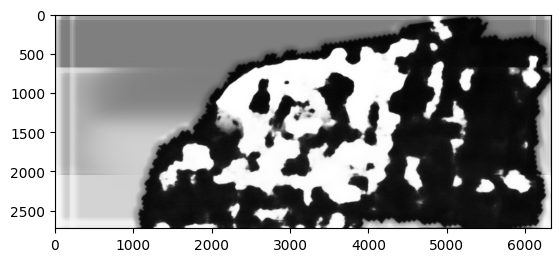

In [ ]:
plt.imshow(predictions[0], cmap='gray')
print(predictions[0])


tensor([[0.3844, 0.3688, 0.3530,  ..., 0.3612, 0.3762, 0.4178],
        [0.3922, 0.3223, 0.3192,  ..., 0.3599, 0.3799, 0.4143],
        [0.3620, 0.3357, 0.3072,  ..., 0.3616, 0.3935, 0.4194],
        ...,
        [0.4410, 0.3770, 0.3749,  ..., 0.3484, 0.3911, 0.3876],
        [0.4082, 0.4503, 0.3916,  ..., 0.3923, 0.3770, 0.4377],
        [0.4775, 0.4526, 0.4899,  ..., 0.4095, 0.4391, 0.4181]])


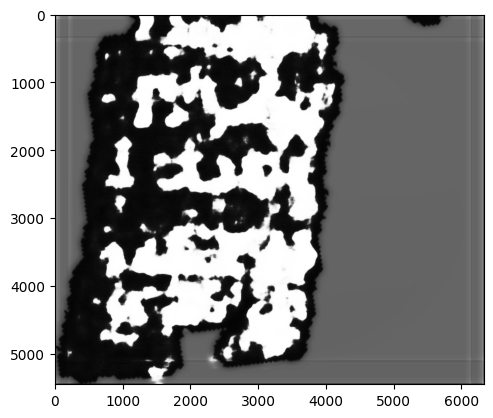

In [ ]:
plt.imshow(predictions[1],  cmap='gray')
print(predictions[1])

In [ ]:
def plot_image(image, title):
  fig = plt.figure()
  plt.title(title)
  plt.imshow(image, cmap='gray')

In [ ]:
!head /content/drive/MyDrive/A_Vesuvius/sample_submission.csv

Id,Predicted
a,1 1 5 1
b,10 20


In [ ]:
submission_df = pd.read_csv(
    '/content/drive/MyDrive/A_Vesuvius/sample_submission.csv')

In [ ]:
test_df = pd.read_csv('/content/drive/MyDrive/A_Vesuvius/data_val.csv',
                     names=['mask', 'stage', 'fragment_id', 'mask_npy',
                             'label', 'label_npy', 'volume_dir', 'volume_npy'])
test_df['mask']

0    /content/drive/MyDrive/A_Vesuvius/test/a/mask.png
1    /content/drive/MyDrive/A_Vesuvius/test/b/mask.png
Name: mask, dtype: object

In [ ]:
train_df

In [ ]:
!pip install lovely_numpy

In [ ]:
import lovely_numpy as ln

In [ ]:
m_ = '/content/drive/MyDrive/A_Vesuvius/train/1/mask.png'
m_ = Image.open(m_)
p_ = predictions[0].numpy()
p_ = np.array(Image.fromarray(p_).resize(m_.size))
#u_lit_model.metrics.val_metrics(p_, m_)
torch.tensor(p_).unsqueeze(0)

tensor([[[0.4137, 0.4184, 0.4072,  ..., 0.3969, 0.4133, 0.4488],
         [0.4165, 0.4165, 0.4065,  ..., 0.3995, 0.4163, 0.4505],
         [0.4245, 0.4108, 0.4043,  ..., 0.4056, 0.4229, 0.4545],
         ...,
         [0.7138, 0.8355, 0.8733,  ..., 0.7480, 0.7253, 0.6233],
         [0.7072, 0.8119, 0.8660,  ..., 0.7219, 0.7261, 0.5986],
         [0.7039, 0.8031, 0.8631,  ..., 0.7124, 0.7256, 0.5895]]])

In [ ]:
m_ = '/content/drive/MyDrive/A_Vesuvius/train/1/mask.png'
m_ = Image.open(m_)
p_ = predictions[0].numpy()
p_ = np.array(Image.fromarray(p_).resize(m_.size))
#u_lit_model.metrics.val_metrics(p__, m_)
#torch.tensor(p_).unsqueeze(0)

In [ ]:
def run_length_encoding_2(x):
  flatten_image  = x.flatten('C')
  flatten_image = np.where(flatten_image > 0.5, 1, 0).astype(np.uint8)
  start_edge = np.array((flatten_image[:-1] ==0) and (flatten_image[1:] ==1))
  start_edge = np.append(np.array((flatten_image[0] ==1)), start_edge)
  end_edge = np.array((flatten_image[:-1] ==1) and (flatten_image[1:] ==0))
  end_edge = np.append(np.array((flatten_image[-1] ==1)), start_edge)
  start_edge_ix = np.where(start_edge)[0] + 1
  end_edge_ix = np.where(end_edge)[0] + 1
  lengths = end_edge_ix - start_edge_ix + 1
  encoded = ''
  for start_, len_ in zip(start_edge_ix, lengths): encoded += f'{start_}{len_}'
  encoded.strip()
  return encoded

In [ ]:
""" rle from the team """
def rle(img):
  pixels = img.flatten()
  pixels = np.concatenate([[0], pixels, [0]])
  runs = np.where(pixels[1:] != pixels[:-1])[0] +1
  runs[1::2] -= runs[::2]
  return ' '.join(str(x) for x in runs)


,Id,Predicted
0,a,201227 1 207556 1 207558 1 207564 1 213885 3 2...
1,b,1247 232 1707 152 2219 41 2747 224 3079 128 32...


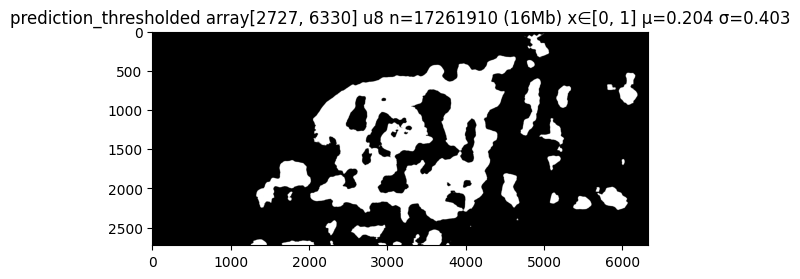

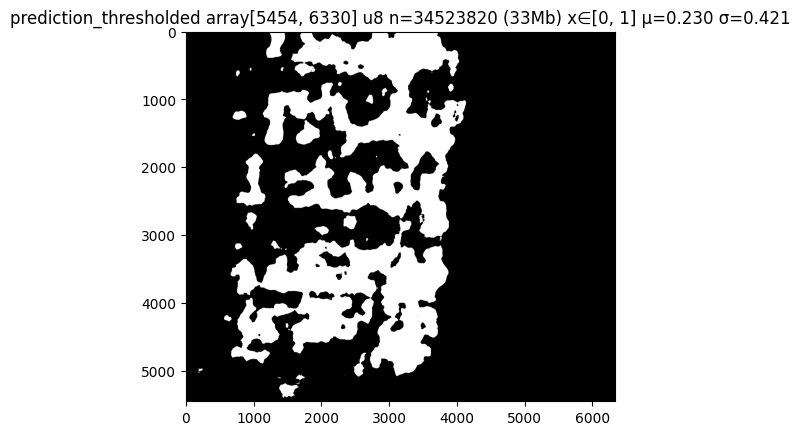

In [ ]:
predictions_rle = []
predictions_ = []
for mask_path, prediction in zip(test_df['mask'].values, predictions):
  prediction = prediction.numpy()
  mask = Image.open(mask_path)
  prediction_resized = np.array(Image.fromarray(prediction).resize(mask.size))
  prediction_masked = prediction_resized*mask
  prediction_thresholded = np.where(prediction_masked > 0.56, 1, 0).astype(np.uint8)
  prediction_rle = rle(prediction_thresholded)
  predictions_rle.append(prediction_rle)

  plot_image(prediction_thresholded,
             f'prediction_thresholded {ln.lovely(prediction_thresholded)}')

submission_df['Predicted'] = predictions_rle
submission_df.to_csv('/content/drive/MyDrive/A_Vesuvius/submission_1.csv', index=False)
submission_df

array[2727, 6330] u8 n=17261910 (16Mb) x∈[0, 1] μ=0.168 σ=0.374
array[5454, 6330] u8 n=34523820 (33Mb) x∈[0, 1] μ=0.205 σ=0.404


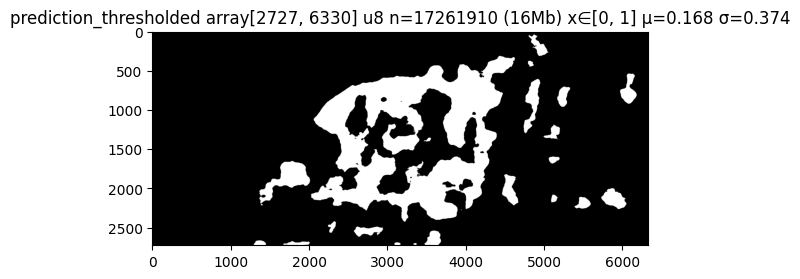

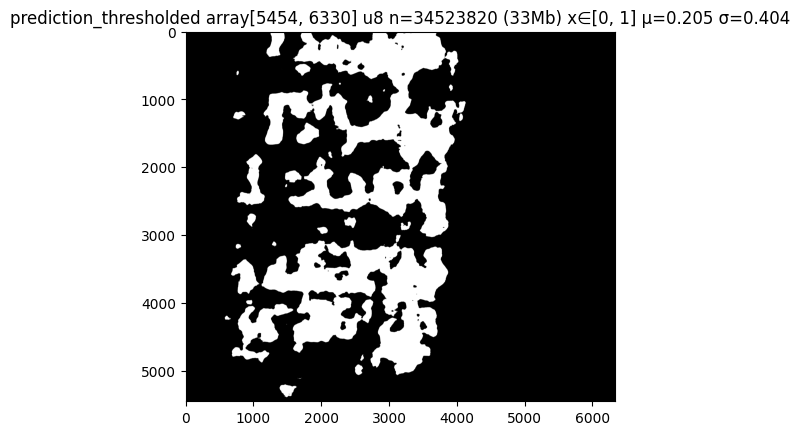

In [ ]:
predictions_rle = []
predictions_ = []
for mask_path, prediction in zip(test_df['mask'].values, predictions):
  prediction = prediction.numpy()
  mask = Image.open(mask_path)
  prediction_resized = np.array(Image.fromarray(prediction).resize(mask.size))
  prediction_masked = prediction_resized*mask
  prediction_thresholded = np.where(prediction_masked > 0.95, 1, 0).astype(np.uint8)
  prediction_rle = rle(prediction_thresholded)
  predictions_rle.append(prediction_rle)

  print(ln.lovely(prediction_thresholded))
  plot_image(prediction_thresholded,

             f'prediction_thresholded {ln.lovely(prediction_thresholded)}')

In [ ]:
submission_df['Predicted'] = predictions_rle
submission_df.to_csv(
    '/content/drive/MyDrive/A_Vesuvius/submission_2.csv', index=False)
submission_df


,Id,Predicted
0,a,277066 2 283395 5 289725 7 296054 9 302383 12 ...
1,b,1258 185 1444 1 1448 1 1722 103 1826 1 1828 1 ...


In [ ]:
""" syntax for submission - kaggle API

kaggle competitions submit project-name \
-f submission.csv -m "My submission message"

"""